# Imports

In [1]:
# Add parent directory to path to import gptransform
import sys
import os
parent_dir = os.path.abspath(os.path.join(os.path.join(os.getcwd(), os.pardir), os.pardir))
sys.path.insert(0, parent_dir)
import gptransform

# Math libraries
import time
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from torch.distributions.multivariate_normal import  MultivariateNormal

# Plotting
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
from matplotlib.ticker import ScalarFormatter
from matplotlib.colors import Normalize
import string
from matplotlib.gridspec import GridSpec
import pandas as pd
import string

# Run in float64 to help with numerical stability
# very crucial, remove with caution
torch.set_default_dtype(torch.float64)

import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 15

# Set up the data

/var/folders/tv/1d811xv917v4wz50x1bqpvcc0000gn/T/ipykernel_19513/209605523.py:17: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3685.)
  r_OO,gr_OO = r_skinner.T, g_OO_skinner.T
/var/folders/tv/1d811xv917v4wz50x1bqpvcc0000gn/T/ipykernel_19513/209605523.py:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  r_OO = torch.tensor(r_OO).to(torch.float64)
/var/folders/tv/1d811xv917v4wz50x1bqpvcc0000gn/T/ipykernel_19513/209605523.py:20: UserWarning: To copy construct from a tensor, it is recommended to 

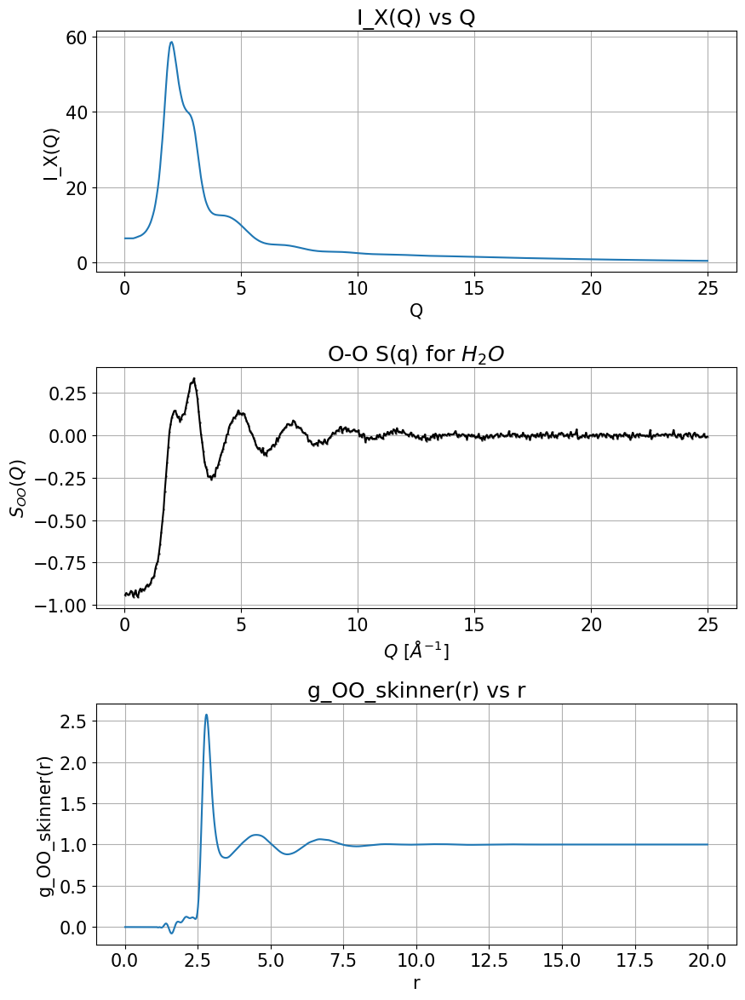

In [2]:
density = 0.1/3

# Load the data
file_path = 'Datasets/Ambient_water_xray_data.txt'
df = pd.read_csv(file_path, sep='\t', skiprows=12, names=[
    'Q', 'I_X(Q)', 'S_OO(Q)', 'r', 'g_OO(r)', 'error'
])

# Convert to PyTorch tensors
Q = torch.tensor(df['Q'].values, dtype=torch.float32)[1:1001:2]
I_X = torch.tensor(df['I_X(Q)'].values, dtype=torch.float32)[1:1001:2]
S_OO_skinner = torch.tensor(df['S_OO(Q)'].values, dtype=torch.float32)[1:1001:2] - 1 + torch.randn_like(Q)*0.01
r_skinner = torch.tensor(df['r'].values, dtype=torch.float32)[1:]
g_OO_skinner = torch.tensor(df['g_OO(r)'].values, dtype=torch.float32)[1:]
error_skinner = torch.tensor(df['error'].values, dtype=torch.float32)[1:]

r_OO,gr_OO = r_skinner.T, g_OO_skinner.T

r_OO = torch.tensor(r_OO).to(torch.float64)
gr_OO = torch.tensor(gr_OO).to(torch.float64)

q = torch.tensor(Q).reshape(len(Q))
# Get noisless partial S(q)
partial_sq_OO = S_OO_skinner

# Convert all these things to column vectors for consistency
r = r_OO

r_grid = torch.linspace(0.01, 25  , 1000).reshape(-1,1)
q_values = q.reshape(-1,1)

partial_sq_OO = partial_sq_OO.reshape(-1,1)

# This allows you to mix up the data so its not ordered by q
perm = torch.randperm(len(partial_sq_OO)).unsqueeze(dim=0)

# Put into Pytorch Dataloader
# Change the reshape command to get different batch sizes, not needed here as there is not enough observations
# so we can do full gradient descent on the LMLH. 
dataset_OO = gptransform.data(q_values[perm].reshape(1,500,1),partial_sq_OO[perm].reshape(1,500,1))

fig, axs = plt.subplots(3, 1, figsize=(9, 12), sharex=False)

# Plot I_X(Q) vs Q
axs[0].plot(Q, I_X)
axs[0].set_xlabel('Q')
axs[0].set_ylabel('I_X(Q)')
axs[0].set_title('I_X(Q) vs Q')
axs[0].grid(True)

# Plot S_OO(Q) vs Q
axs[1].plot(Q, S_OO_skinner,color='k')
axs[1].scatter(Q, S_OO_skinner,color='k',alpha=0.5,s=1)
axs[1].set_xlabel('$Q \ [\AA^{-1}]$')
axs[1].set_ylabel('$S_{OO}(Q)$')
axs[1].set_title('O-O S(q) for $H_2O$')
axs[1].grid(True)

# Plot g_OO(r) vs r
axs[2].plot(r, g_OO_skinner, label='g_OO(r)')
axs[2].set_xlabel('r')
axs[2].set_ylabel('g_OO_skinner(r)')
axs[2].set_title('g_OO_skinner(r) vs r')
axs[2].grid(True)
plt.tight_layout()
plt.show()

# Just save these for later
q_infer = q_values
r_infer = r_grid
temp = 298.15

# Run the optimization

Average loss: -427.890324  [    0/ 1000]
l:       1.224850 
max:     3.020227 
slope:   5.637755 
loc:     2.934557 
decay:   0.538227 
sigma_n: 0.146763 
r_0:     2.786941 
s:       24.959936 
Minutes Taken Since Last Report: 0.109128 



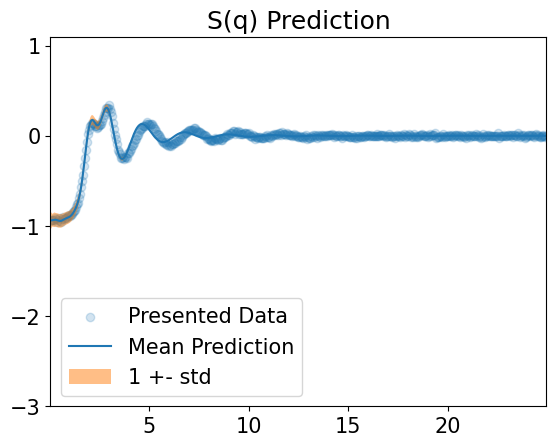

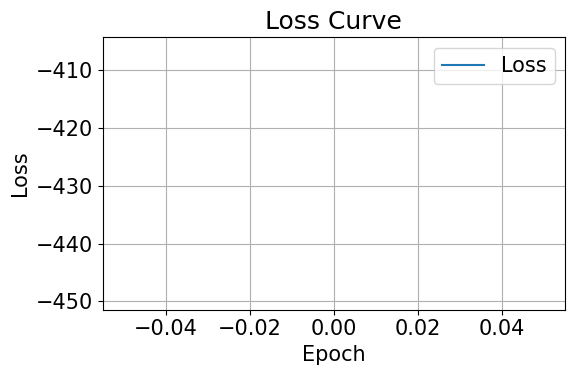

Average loss: -517.295068  [   25/ 1000]
l:       1.111129 
max:     2.952976 
slope:   5.689510 
loc:     2.771554 
decay:   0.645457 
sigma_n: 0.122323 
r_0:     2.566803 
s:       26.430247 
Minutes Taken Since Last Report: 2.074447 



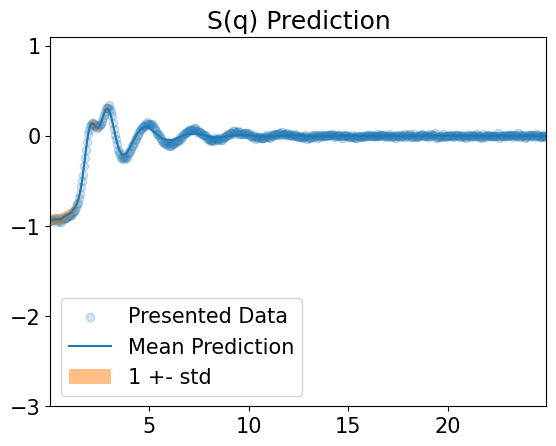

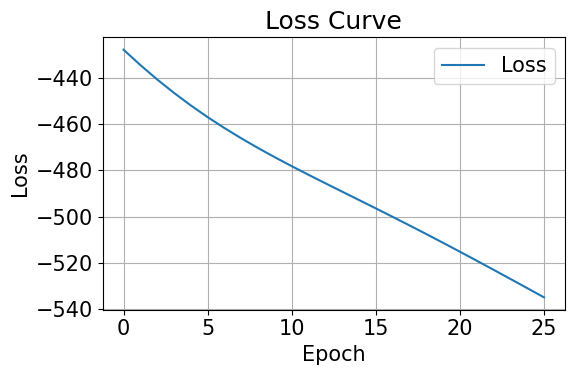

Average loss: -617.288846  [   50/ 1000]
l:       1.005555 
max:     2.604170 
slope:   6.733599 
loc:     2.771246 
decay:   0.755192 
sigma_n: 0.100419 
r_0:     2.603318 
s:       29.199885 
Minutes Taken Since Last Report: 2.203194 



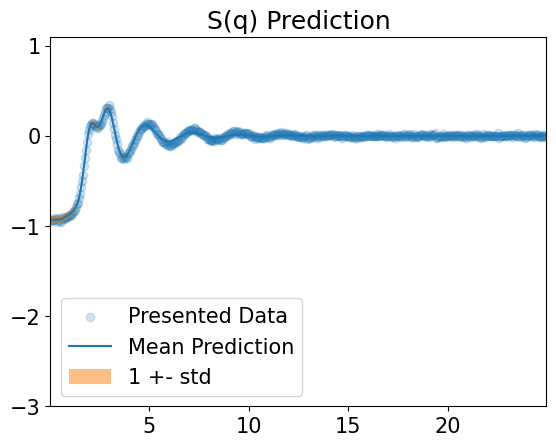

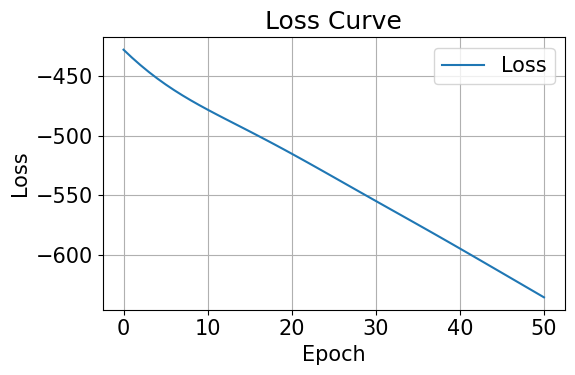

Average loss: -721.672153  [   75/ 1000]
l:       0.908970 
max:     2.396662 
slope:   7.962309 
loc:     2.735823 
decay:   0.857796 
sigma_n: 0.081256 
r_0:     2.624621 
s:       30.842447 
Minutes Taken Since Last Report: 2.023123 



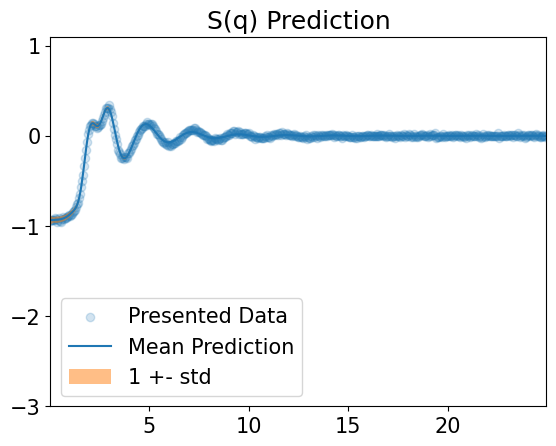

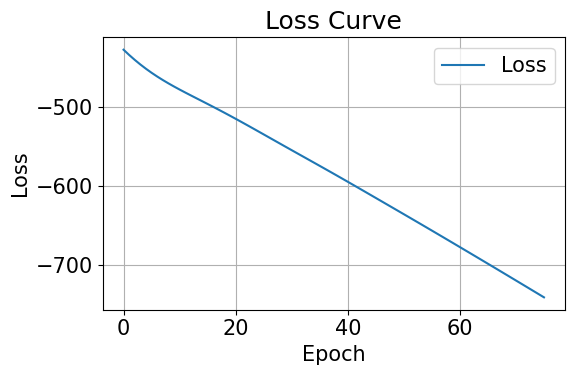

Average loss: -829.161702  [  100/ 1000]
l:       0.817886 
max:     2.356602 
slope:   9.348911 
loc:     2.715998 
decay:   0.935638 
sigma_n: 0.065002 
r_0:     2.638806 
s:       31.700551 
Minutes Taken Since Last Report: 2.069116 



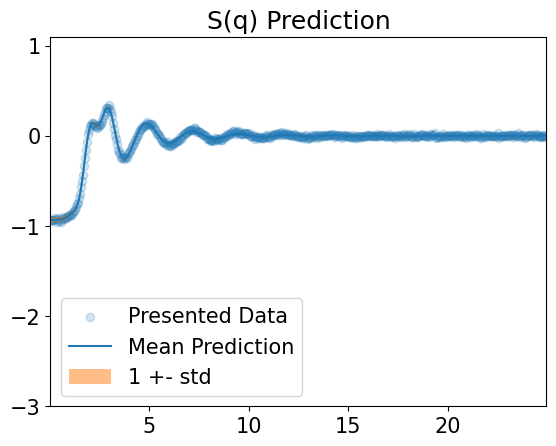

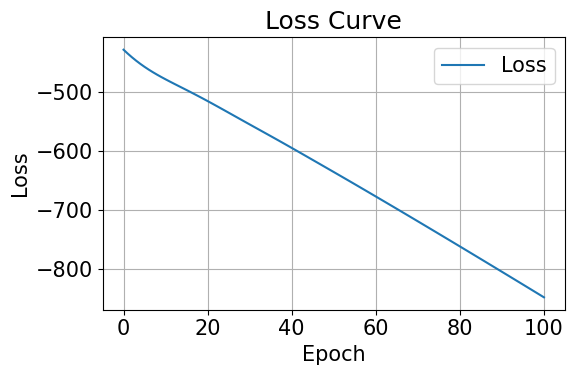

Average loss: -938.635205  [  125/ 1000]
l:       0.719412 
max:     2.508416 
slope:   10.691023 
loc:     2.706917 
decay:   0.979415 
sigma_n: 0.051567 
r_0:     2.658575 
s:       31.929150 
Minutes Taken Since Last Report: 2.107362 



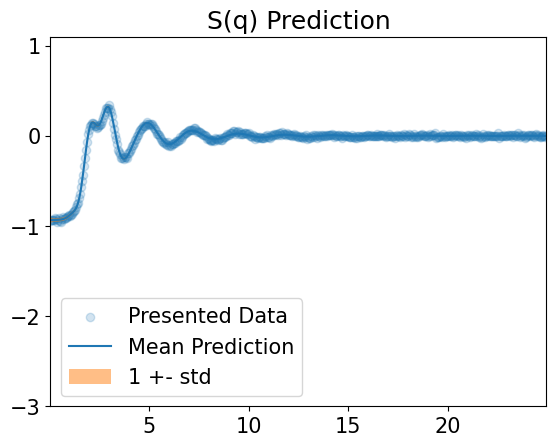

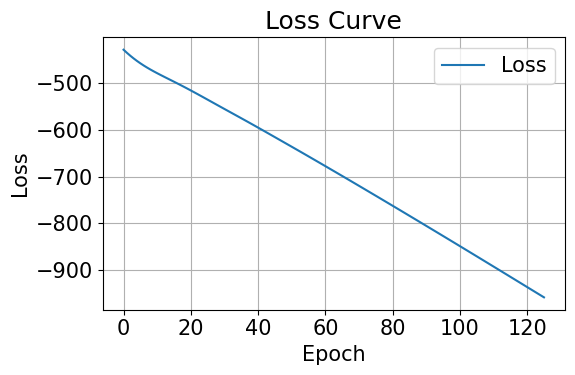

Average loss: -1047.678441  [  150/ 1000]
l:       0.652931 
max:     2.645621 
slope:   11.655448 
loc:     2.697942 
decay:   1.013504 
sigma_n: 0.040714 
r_0:     2.679192 
s:       31.608871 
Minutes Taken Since Last Report: 2.661480 



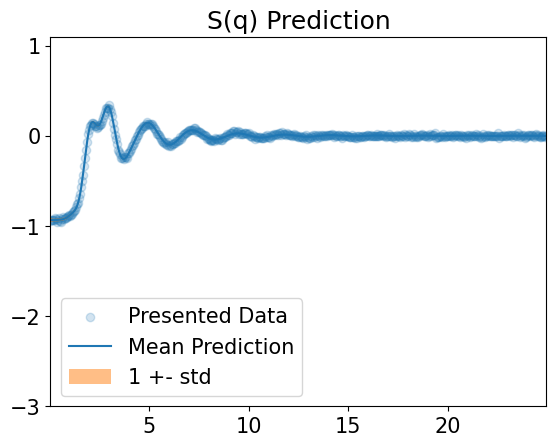

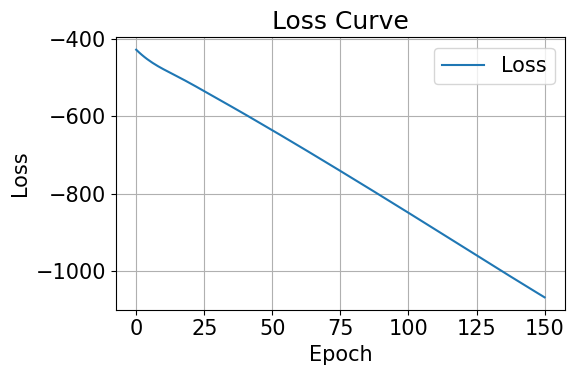

Average loss: -1152.076276  [  175/ 1000]
l:       0.637051 
max:     2.744534 
slope:   12.115327 
loc:     2.697214 
decay:   1.033378 
sigma_n: 0.032171 
r_0:     2.691946 
s:       31.599628 
Minutes Taken Since Last Report: 2.509508 



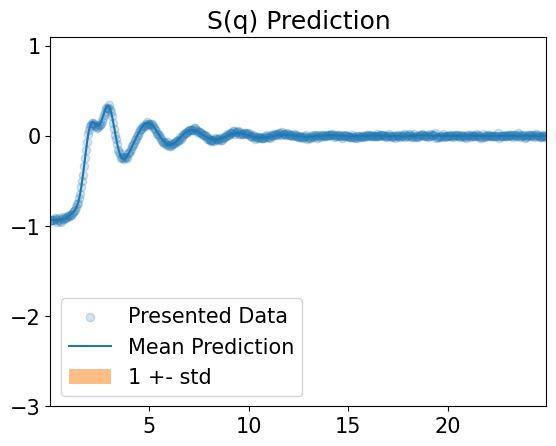

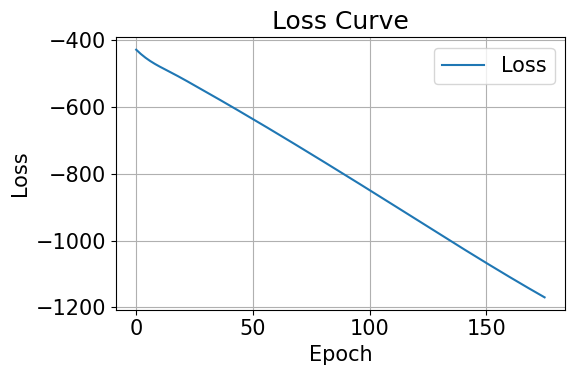

Average loss: -1247.738391  [  200/ 1000]
l:       0.643500 
max:     2.910467 
slope:   12.112123 
loc:     2.704639 
decay:   1.038650 
sigma_n: 0.025601 
r_0:     2.696623 
s:       32.502587 
Minutes Taken Since Last Report: 2.724094 



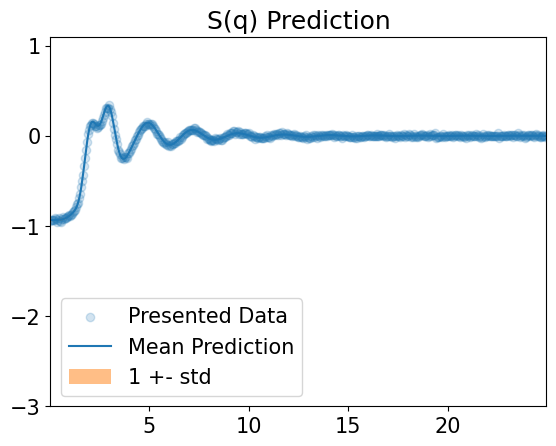

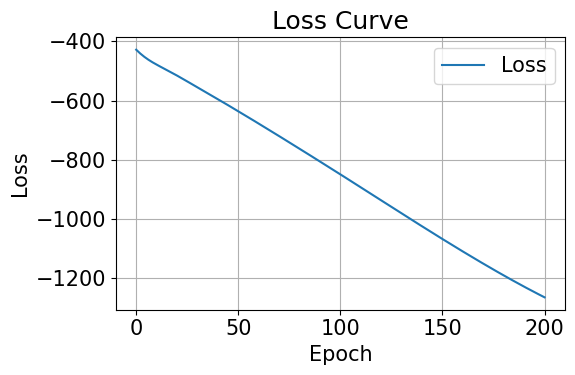

Average loss: -1329.570728  [  225/ 1000]
l:       0.654392 
max:     3.133625 
slope:   11.796109 
loc:     2.719058 
decay:   1.048168 
sigma_n: 0.020676 
r_0:     2.694263 
s:       34.028677 
Minutes Taken Since Last Report: 2.549737 



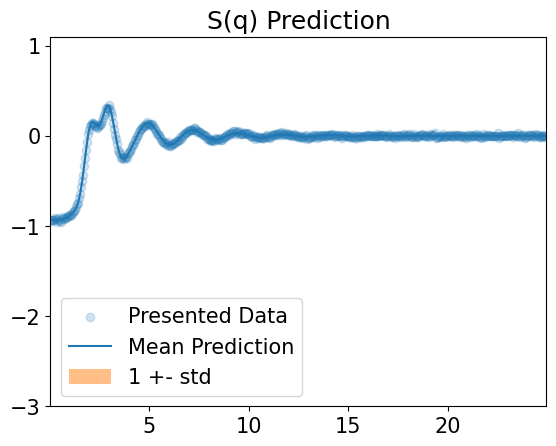

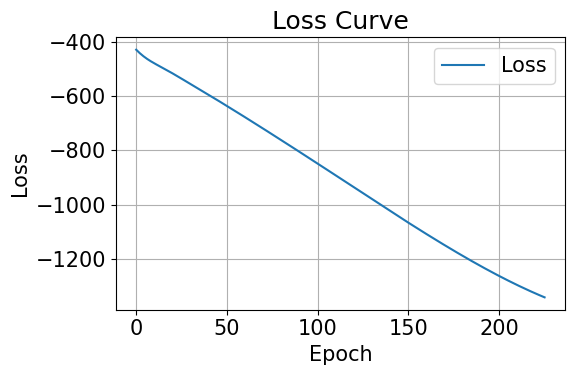

Average loss: -1392.521728  [  250/ 1000]
l:       0.656131 
max:     3.428594 
slope:   11.468807 
loc:     2.735403 
decay:   1.064090 
sigma_n: 0.017107 
r_0:     2.690306 
s:       35.689686 
Minutes Taken Since Last Report: 2.647862 



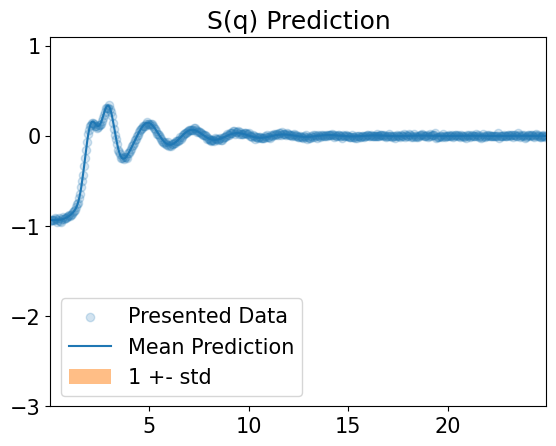

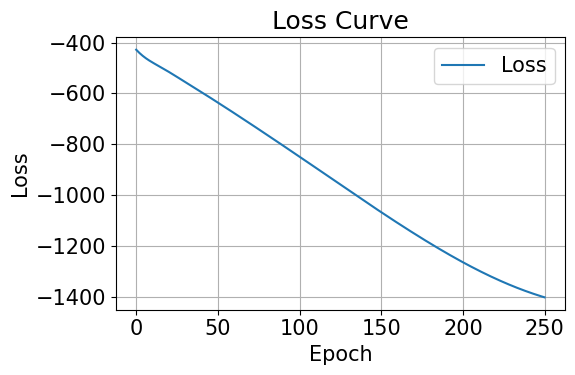

Average loss: -1433.955240  [  275/ 1000]
l:       0.646778 
max:     3.747462 
slope:   11.253702 
loc:     2.749477 
decay:   1.082815 
sigma_n: 0.014648 
r_0:     2.687527 
s:       37.060935 
Minutes Taken Since Last Report: 2.305948 



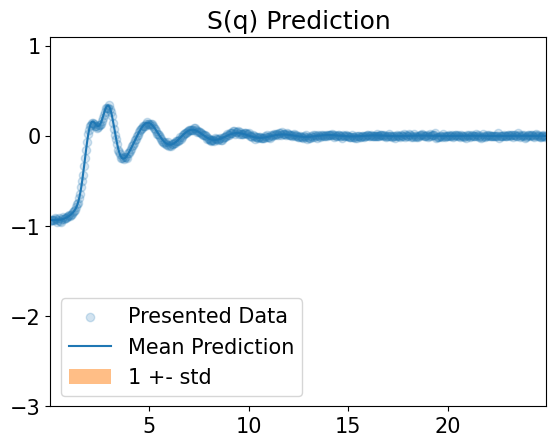

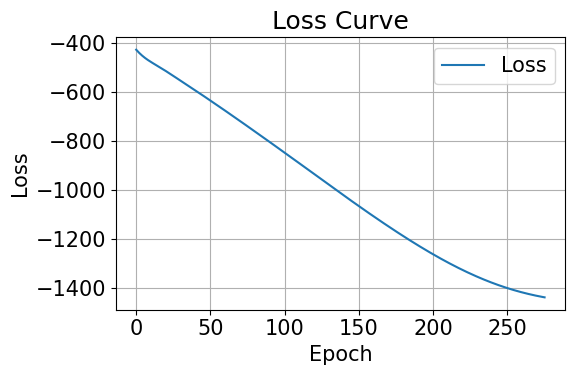

Average loss: -1456.012140  [  300/ 1000]
l:       0.633494 
max:     4.021800 
slope:   11.071621 
loc:     2.761358 
decay:   1.097565 
sigma_n: 0.013073 
r_0:     2.684705 
s:       38.063486 
Minutes Taken Since Last Report: 2.701905 



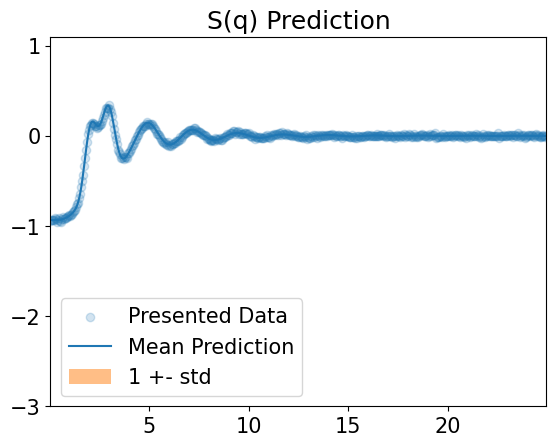

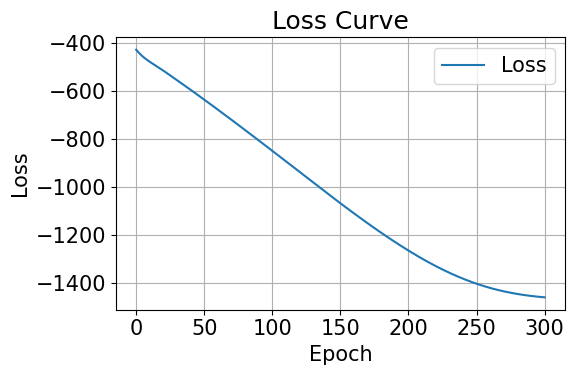

Average loss: -1465.068335  [  325/ 1000]
l:       0.627233 
max:     4.210548 
slope:   10.978224 
loc:     2.768204 
decay:   1.103539 
sigma_n: 0.012161 
r_0:     2.682976 
s:       38.824167 
Minutes Taken Since Last Report: 2.655028 



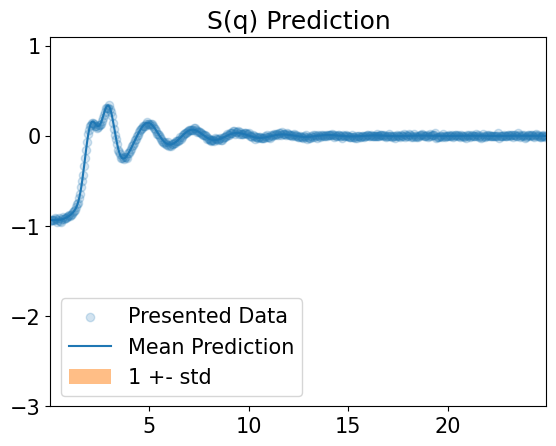

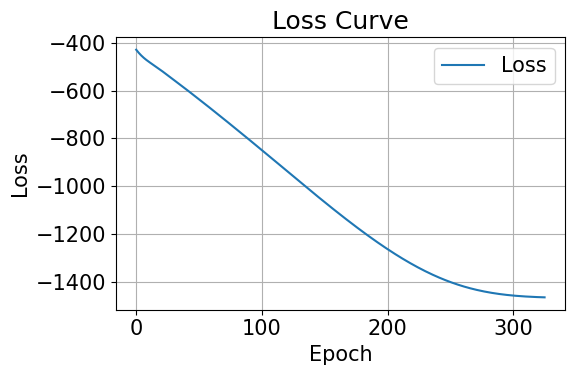

Average loss: -1467.921763  [  350/ 1000]
l:       0.628067 
max:     4.328181 
slope:   10.954155 
loc:     2.770999 
decay:   1.101876 
sigma_n: 0.011693 
r_0:     2.682308 
s:       39.286196 
Minutes Taken Since Last Report: 2.622149 



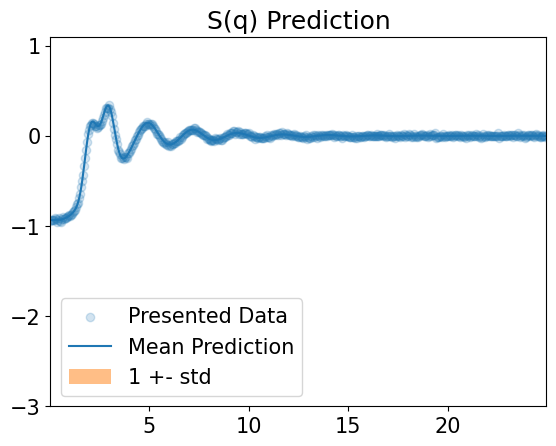

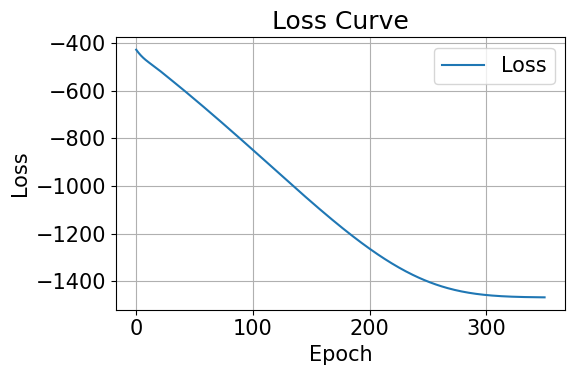

Average loss: -1468.662352  [  375/ 1000]
l:       0.629677 
max:     4.392201 
slope:   10.948979 
loc:     2.772082 
decay:   1.098640 
sigma_n: 0.011482 
r_0:     2.682063 
s:       39.497462 
Minutes Taken Since Last Report: 3.179809 



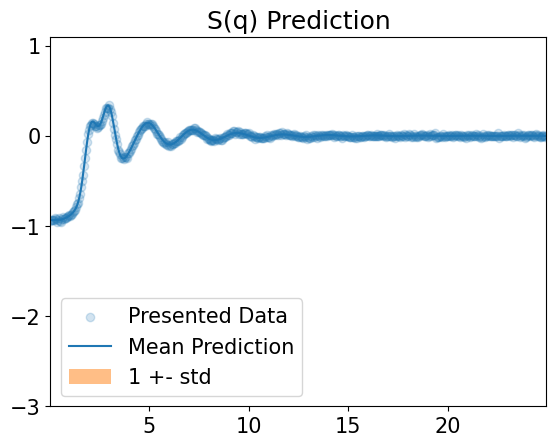

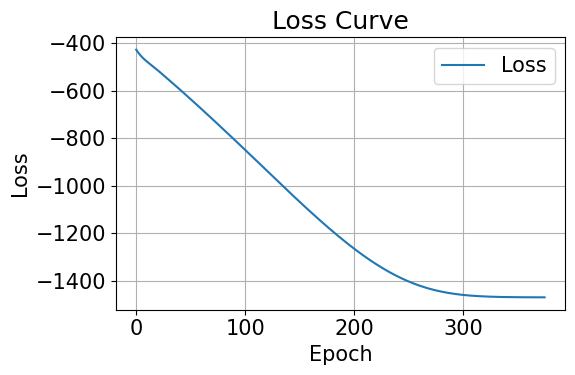

Average loss: -1468.844829  [  400/ 1000]
l:       0.630489 
max:     4.417663 
slope:   10.947564 
loc:     2.772463 
decay:   1.096504 
sigma_n: 0.011398 
r_0:     2.681978 
s:       39.582185 
Minutes Taken Since Last Report: 26.395549 



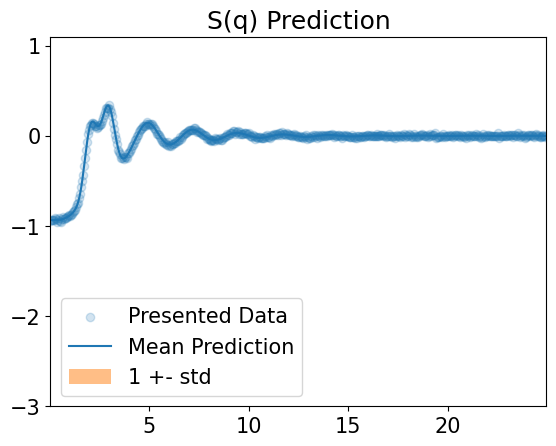

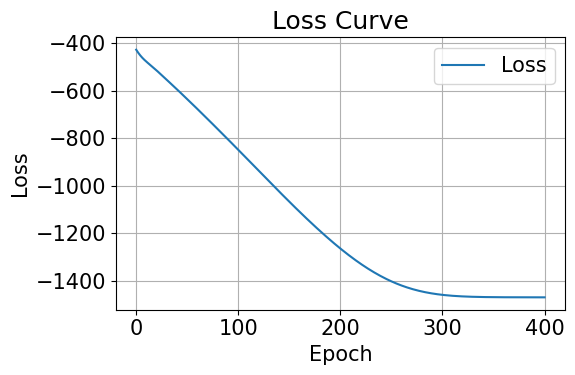

Average loss: -1468.894215  [  425/ 1000]
l:       0.630697 
max:     4.422935 
slope:   10.946637 
loc:     2.772568 
decay:   1.095302 
sigma_n: 0.011366 
r_0:     2.681952 
s:       39.614622 
Minutes Taken Since Last Report: 2.120016 



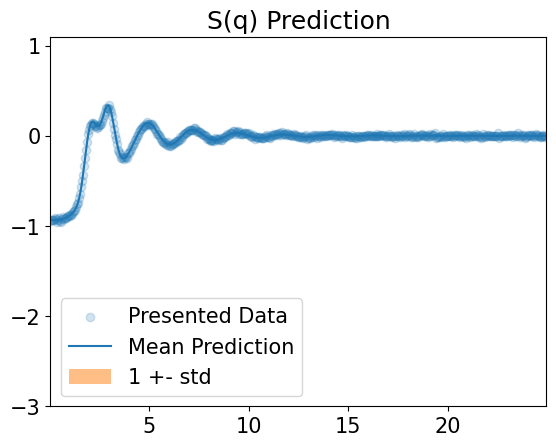

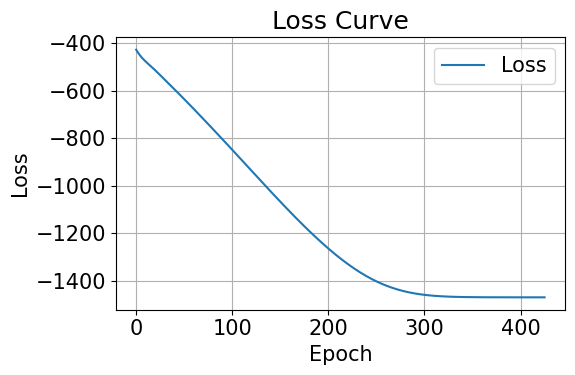

Average loss: -1468.910377  [  450/ 1000]
l:       0.630620 
max:     4.420008 
slope:   10.945634 
loc:     2.772577 
decay:   1.094547 
sigma_n: 0.011354 
r_0:     2.681945 
s:       39.627758 
Minutes Taken Since Last Report: 2.060040 



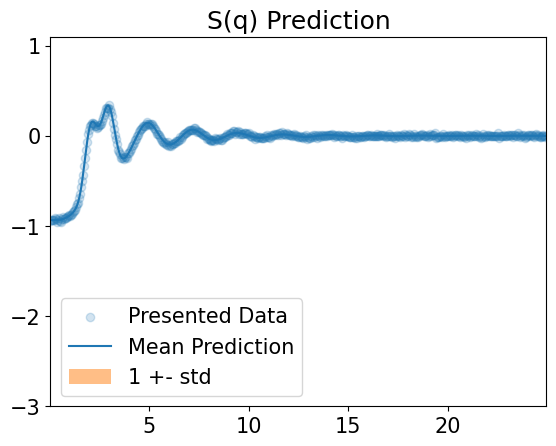

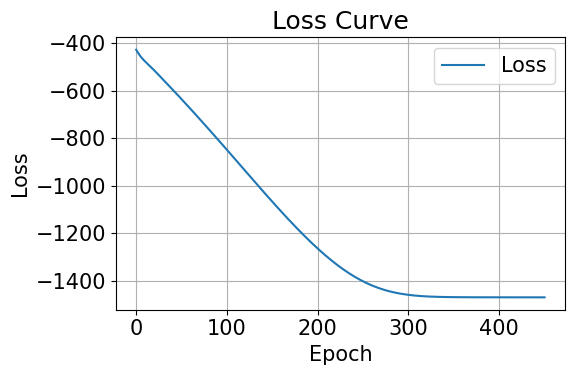

Average loss: -1468.917678  [  475/ 1000]
l:       0.630449 
max:     4.414471 
slope:   10.944584 
loc:     2.772558 
decay:   1.093945 
sigma_n: 0.011347 
r_0:     2.681944 
s:       39.634979 
Minutes Taken Since Last Report: 1.890079 



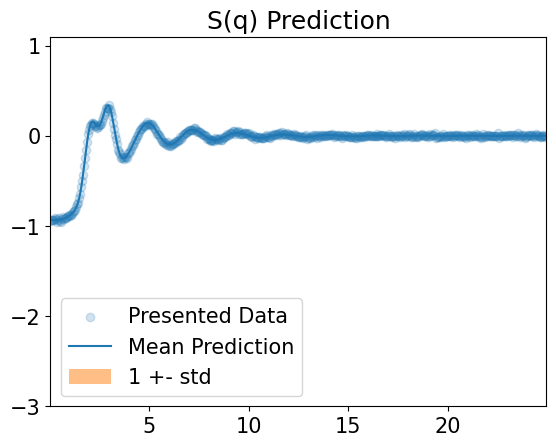

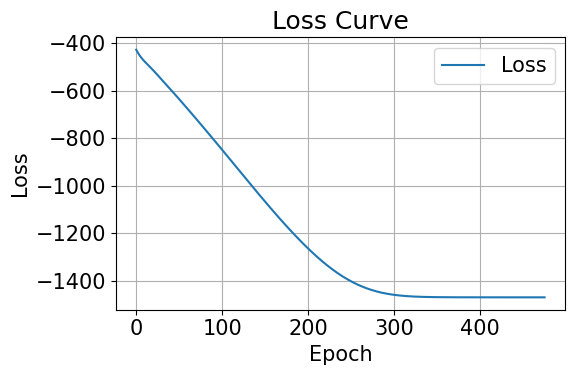

Average loss: -1468.922556  [  500/ 1000]
l:       0.630258 
max:     4.408342 
slope:   10.943555 
loc:     2.772531 
decay:   1.093386 
sigma_n: 0.011343 
r_0:     2.681945 
s:       39.640564 
Minutes Taken Since Last Report: 1.841939 



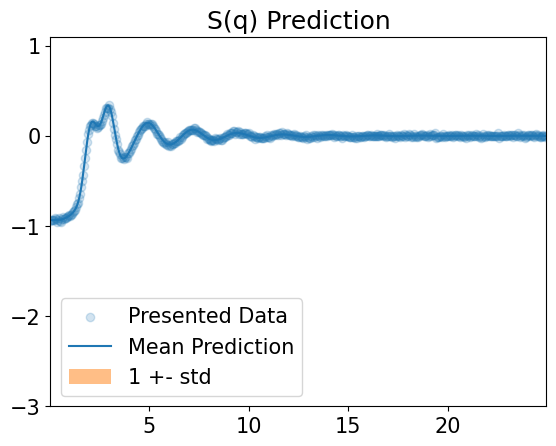

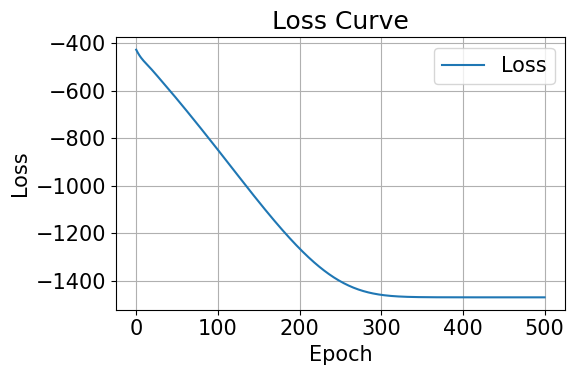

Average loss: -1468.926655  [  525/ 1000]
l:       0.630069 
max:     4.402213 
slope:   10.942563 
loc:     2.772501 
decay:   1.092848 
sigma_n: 0.011338 
r_0:     2.681946 
s:       39.645616 
Minutes Taken Since Last Report: 2.014986 



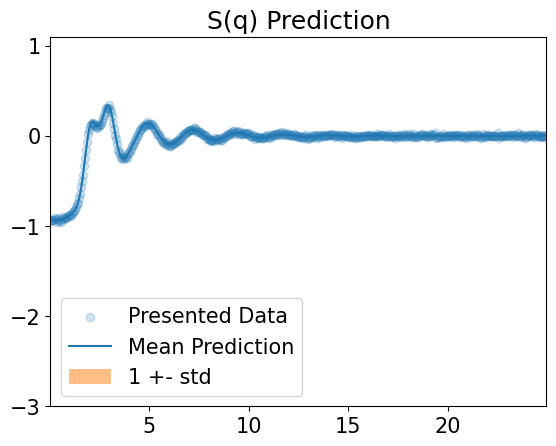

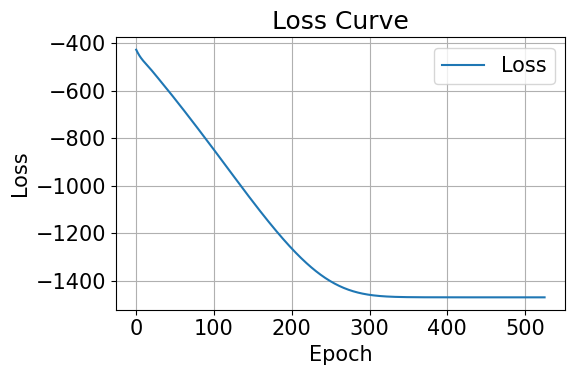

Average loss: -1468.930338  [  550/ 1000]
l:       0.629886 
max:     4.396244 
slope:   10.941612 
loc:     2.772472 
decay:   1.092328 
sigma_n: 0.011334 
r_0:     2.681948 
s:       39.650371 
Minutes Taken Since Last Report: 1.984687 



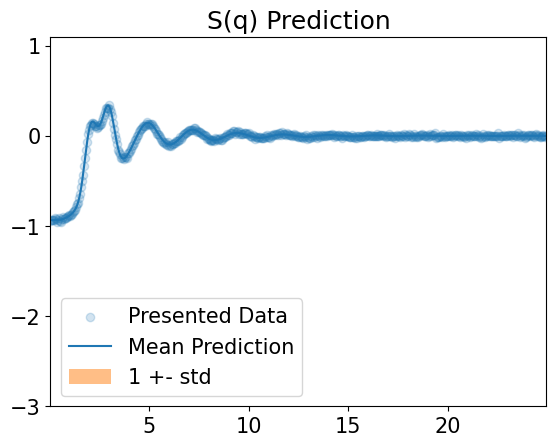

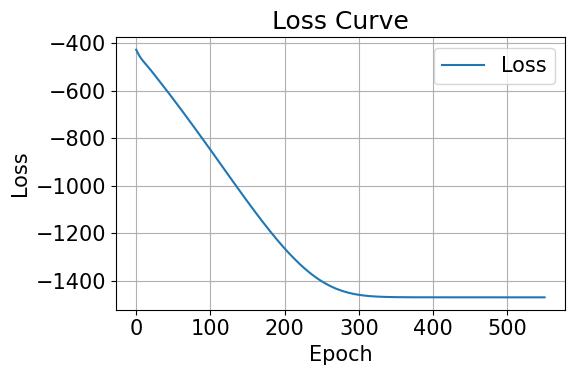

Average loss: -1468.933683  [  575/ 1000]
l:       0.629710 
max:     4.390489 
slope:   10.940706 
loc:     2.772443 
decay:   1.091828 
sigma_n: 0.011330 
r_0:     2.681950 
s:       39.654857 
Minutes Taken Since Last Report: 2.072079 



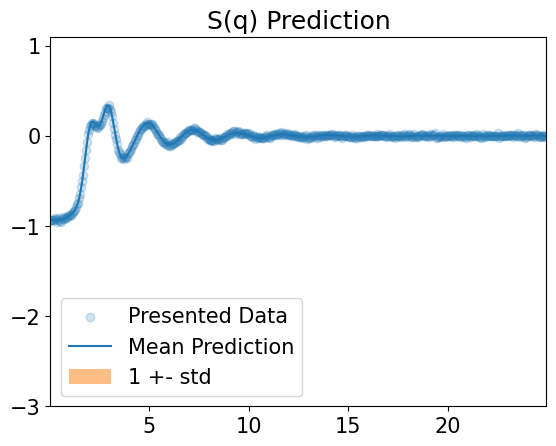

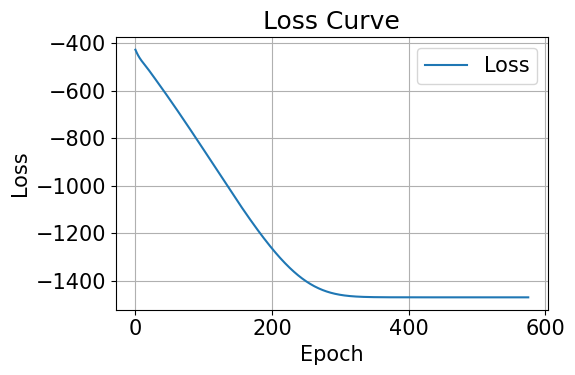

Average loss: -1468.936724  [  600/ 1000]
l:       0.629542 
max:     4.384977 
slope:   10.939845 
loc:     2.772414 
decay:   1.091349 
sigma_n: 0.011327 
r_0:     2.681951 
s:       39.659082 
Minutes Taken Since Last Report: 2.085871 



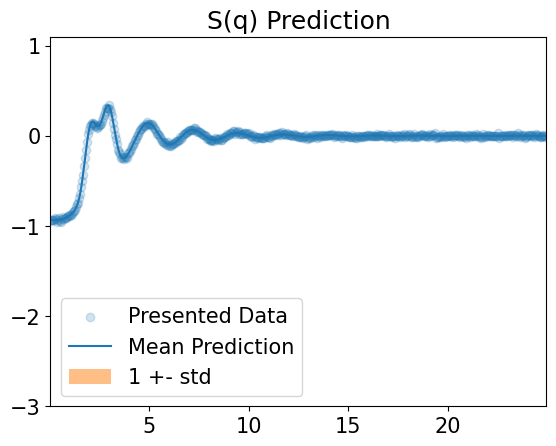

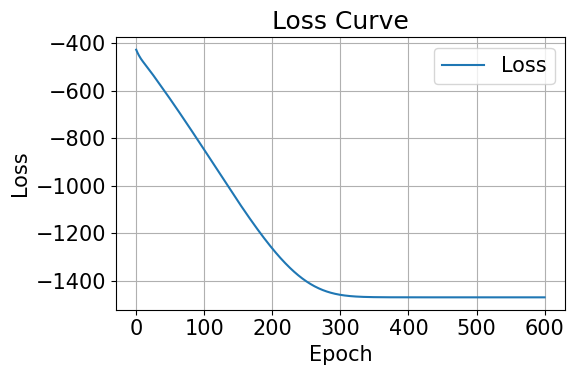

Average loss: -1468.939496  [  625/ 1000]
l:       0.629383 
max:     4.379726 
slope:   10.939030 
loc:     2.772387 
decay:   1.090893 
sigma_n: 0.011323 
r_0:     2.681953 
s:       39.663062 
Minutes Taken Since Last Report: 2.187431 



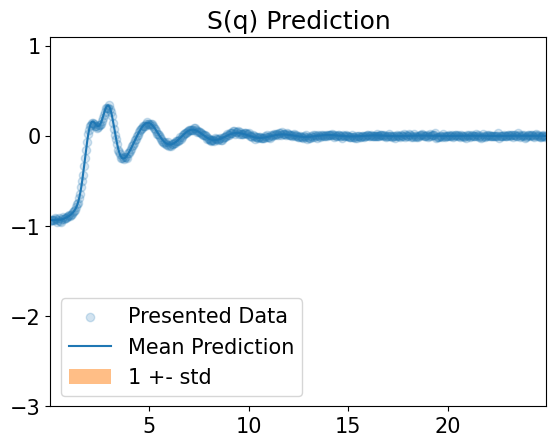

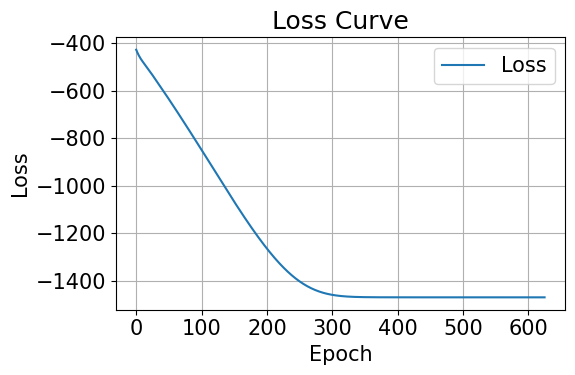

Average loss: -1468.942030  [  650/ 1000]
l:       0.629232 
max:     4.374747 
slope:   10.938259 
loc:     2.772361 
decay:   1.090459 
sigma_n: 0.011320 
r_0:     2.681955 
s:       39.666814 
Minutes Taken Since Last Report: 2.001516 



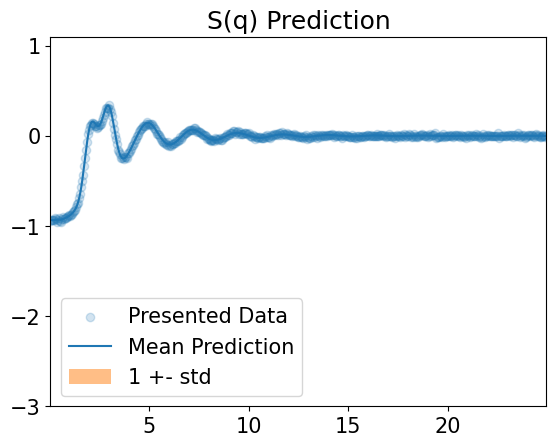

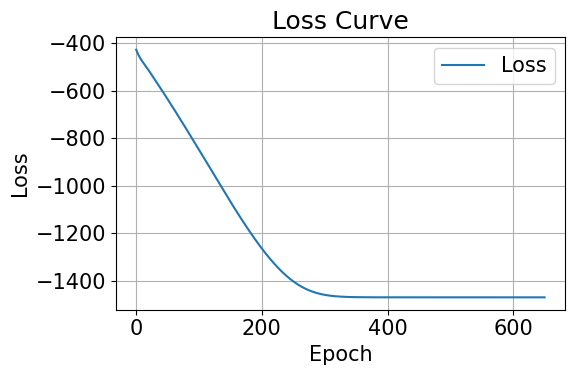

Average loss: -1468.944354  [  675/ 1000]
l:       0.629090 
max:     4.370041 
slope:   10.937531 
loc:     2.772336 
decay:   1.090047 
sigma_n: 0.011317 
r_0:     2.681956 
s:       39.670356 
Minutes Taken Since Last Report: 2.236825 



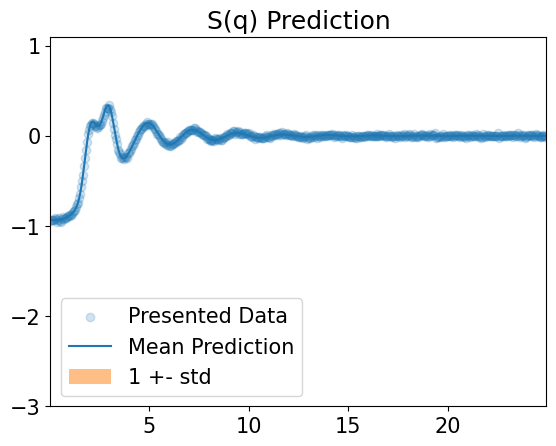

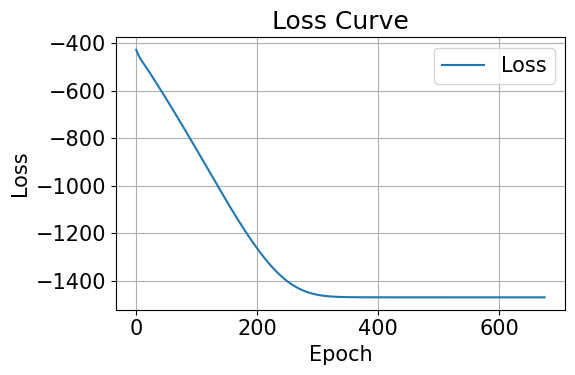

Average loss: -1468.946492  [  700/ 1000]
l:       0.628956 
max:     4.365606 
slope:   10.936845 
loc:     2.772312 
decay:   1.089658 
sigma_n: 0.011315 
r_0:     2.681958 
s:       39.673702 
Minutes Taken Since Last Report: 2.054754 



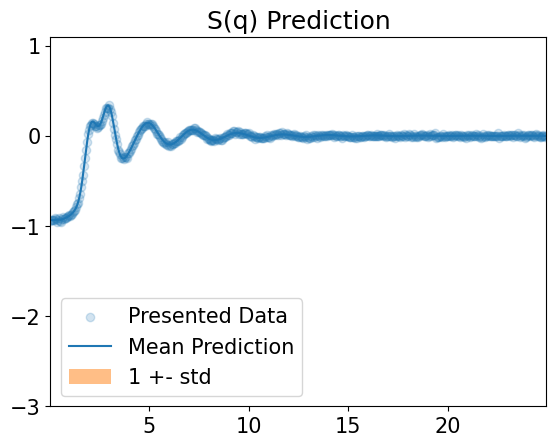

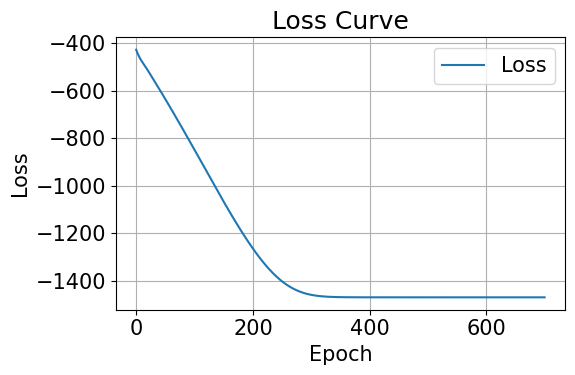

Average loss: -1468.948465  [  725/ 1000]
l:       0.628830 
max:     4.361432 
slope:   10.936199 
loc:     2.772290 
decay:   1.089289 
sigma_n: 0.011312 
r_0:     2.681959 
s:       39.676868 
Minutes Taken Since Last Report: 2.096613 



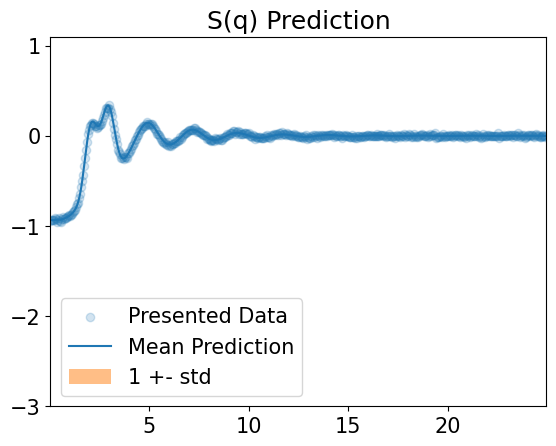

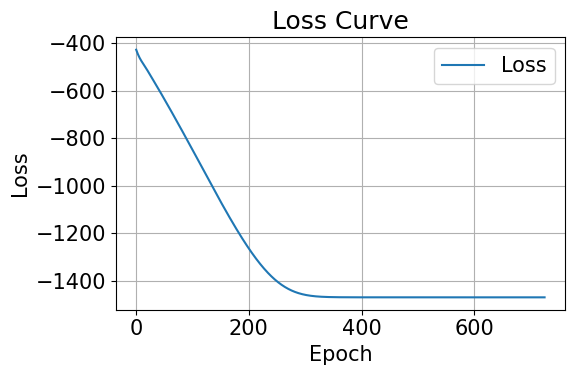

Average loss: -1468.950291  [  750/ 1000]
l:       0.628712 
max:     4.357507 
slope:   10.935589 
loc:     2.772269 
decay:   1.088940 
sigma_n: 0.011309 
r_0:     2.681961 
s:       39.679867 
Minutes Taken Since Last Report: 2.066495 



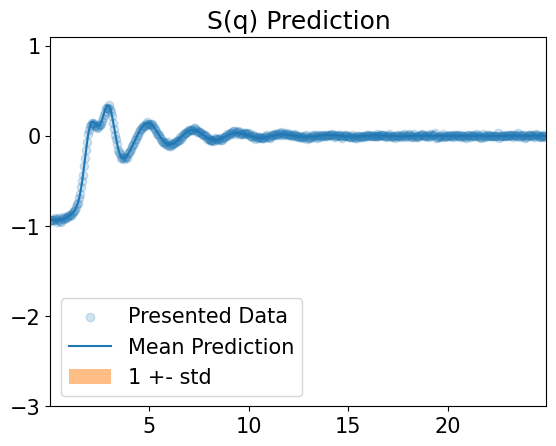

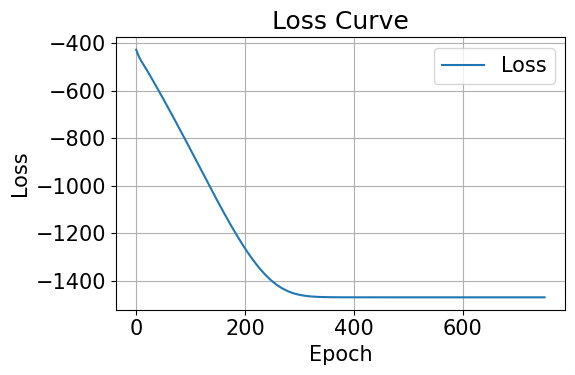

Average loss: -1468.951984  [  775/ 1000]
l:       0.628601 
max:     4.353817 
slope:   10.935014 
loc:     2.772250 
decay:   1.088609 
sigma_n: 0.011307 
r_0:     2.681962 
s:       39.682713 
Minutes Taken Since Last Report: 2.144356 



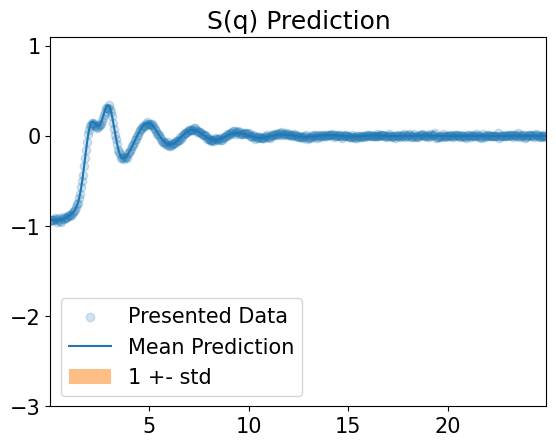

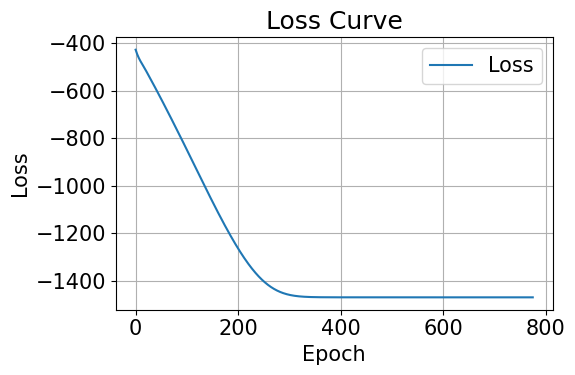

Average loss: -1468.953559  [  800/ 1000]
l:       0.628497 
max:     4.350348 
slope:   10.934471 
loc:     2.772231 
decay:   1.088296 
sigma_n: 0.011305 
r_0:     2.681963 
s:       39.685418 
Minutes Taken Since Last Report: 1.925883 



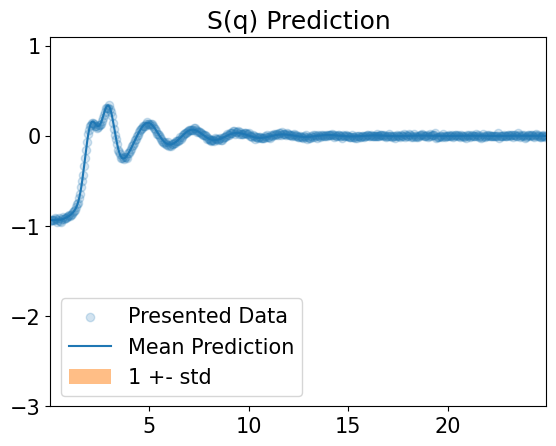

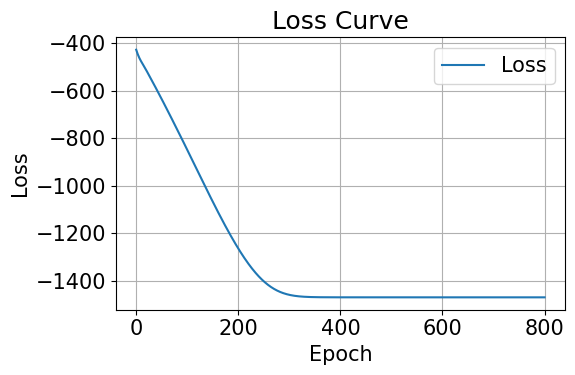

Average loss: -1468.955026  [  825/ 1000]
l:       0.628398 
max:     4.347083 
slope:   10.933958 
loc:     2.772214 
decay:   1.087999 
sigma_n: 0.011303 
r_0:     2.681964 
s:       39.687991 
Minutes Taken Since Last Report: 1.936956 



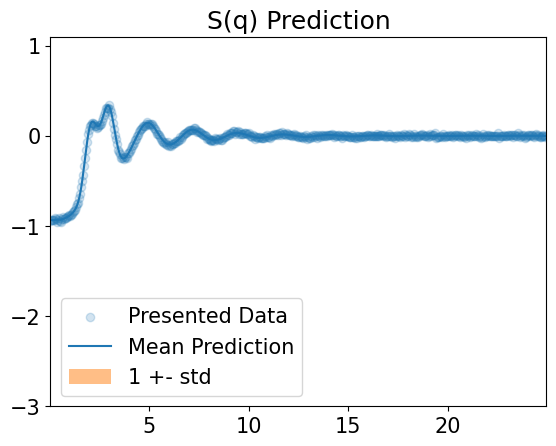

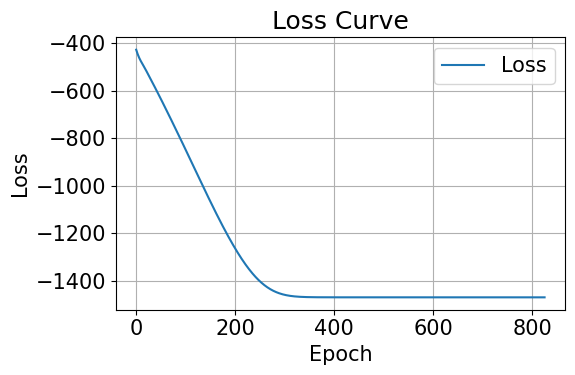

Average loss: -1468.956396  [  850/ 1000]
l:       0.628306 
max:     4.344007 
slope:   10.933472 
loc:     2.772198 
decay:   1.087718 
sigma_n: 0.011300 
r_0:     2.681965 
s:       39.690443 
Minutes Taken Since Last Report: 2.046801 



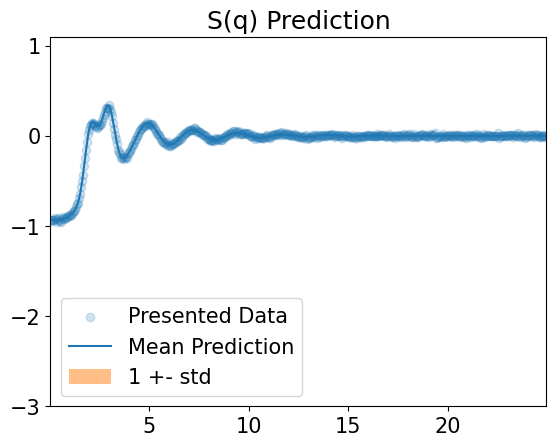

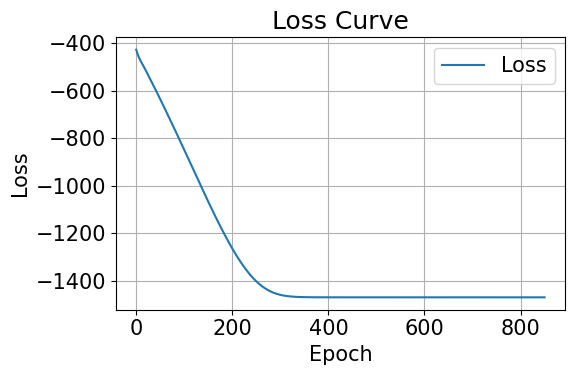

Average loss: -1468.957678  [  875/ 1000]
l:       0.628219 
max:     4.341105 
slope:   10.933012 
loc:     2.772183 
decay:   1.087450 
sigma_n: 0.011298 
r_0:     2.681966 
s:       39.692784 
Minutes Taken Since Last Report: 2.027412 



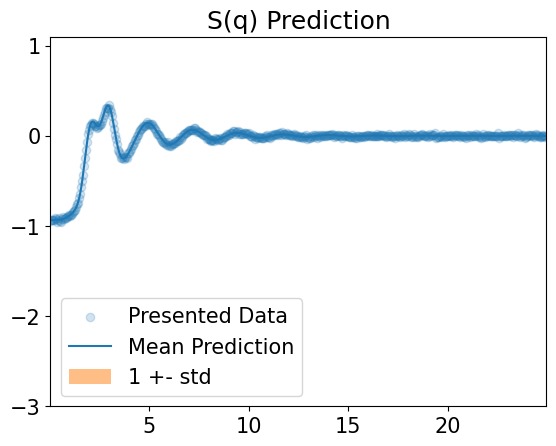

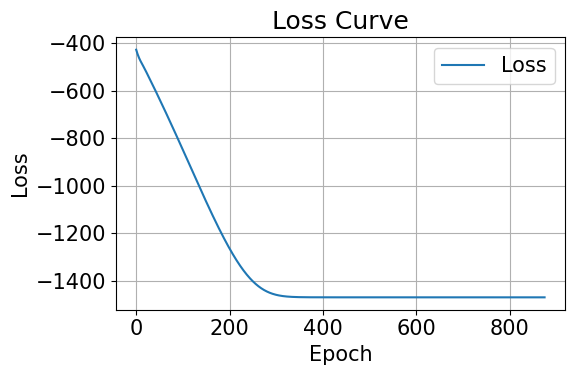

Average loss: -1468.958880  [  900/ 1000]
l:       0.628136 
max:     4.338362 
slope:   10.932575 
loc:     2.772168 
decay:   1.087195 
sigma_n: 0.011297 
r_0:     2.681967 
s:       39.695021 
Minutes Taken Since Last Report: 2.078194 



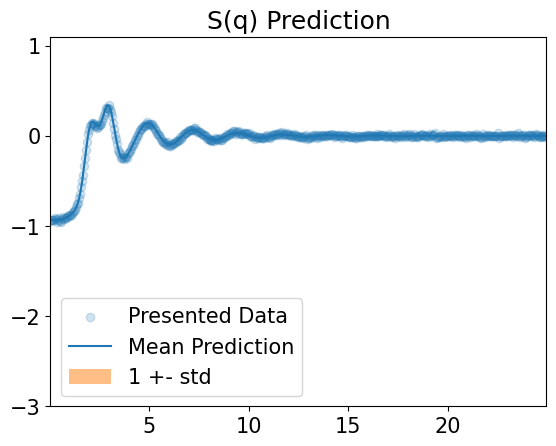

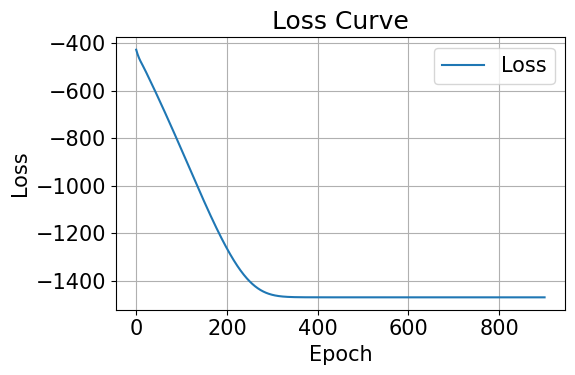

Average loss: -1468.960008  [  925/ 1000]
l:       0.628058 
max:     4.335766 
slope:   10.932159 
loc:     2.772155 
decay:   1.086952 
sigma_n: 0.011295 
r_0:     2.681968 
s:       39.697162 
Minutes Taken Since Last Report: 2.066052 



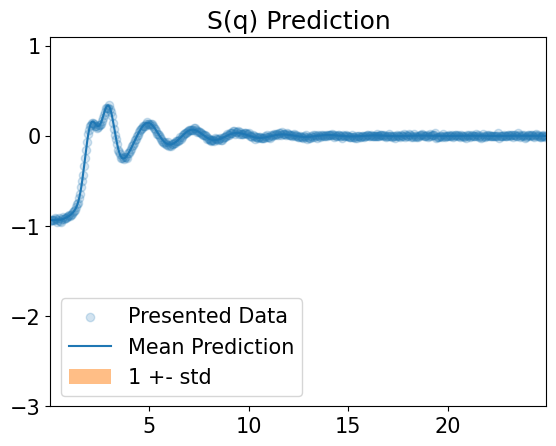

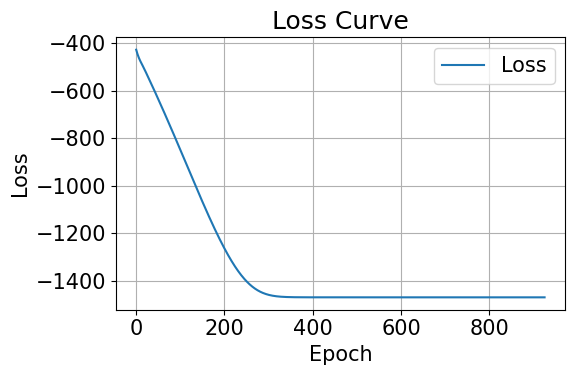

Average loss: -1468.961070  [  950/ 1000]
l:       0.627984 
max:     4.333303 
slope:   10.931763 
loc:     2.772142 
decay:   1.086720 
sigma_n: 0.011293 
r_0:     2.681968 
s:       39.699214 
Minutes Taken Since Last Report: 2.075394 



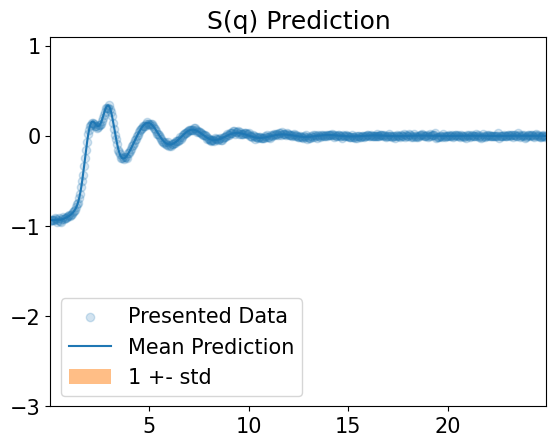

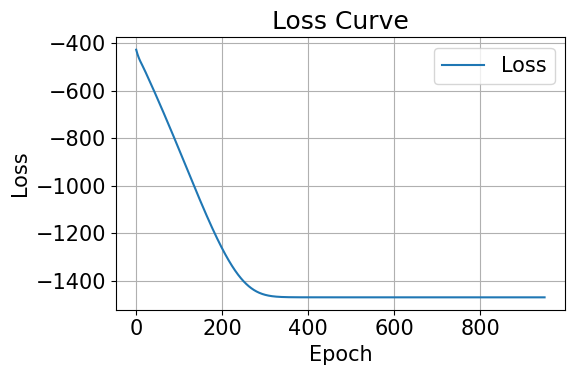

Average loss: -1468.961897  [  975/ 1000]
l:       0.627917 
max:     4.330932 
slope:   10.931296 
loc:     2.772290 
decay:   1.086498 
sigma_n: 0.011291 
r_0:     2.682713 
s:       39.701293 
Minutes Taken Since Last Report: 2.002157 



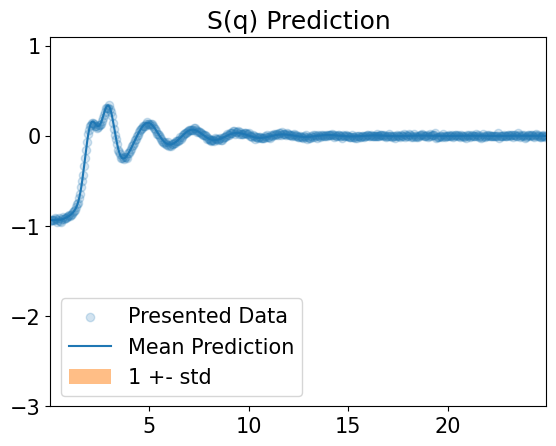

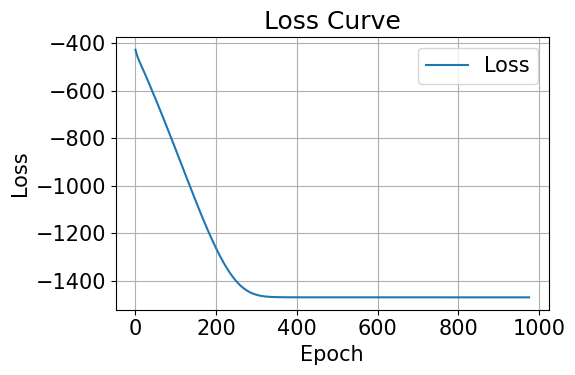

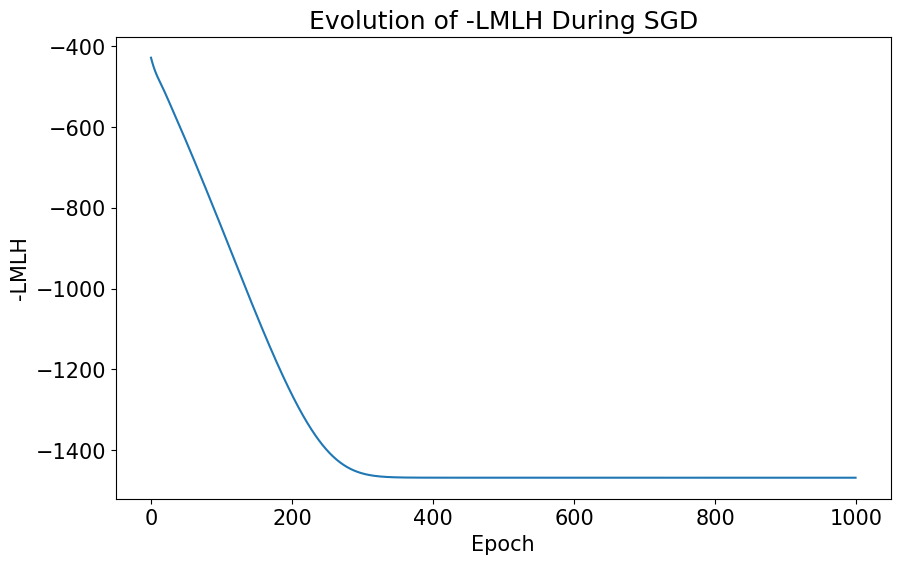

In [3]:
psq_name = 'OO'

init_param_bounds = torch.zeros((8,2))

### Width Function Params ###

# Ell
init_param_bounds[0,1] = 2.5
init_param_bounds[0,0] = 0.1

# Max
init_param_bounds[1,1] = 10
init_param_bounds[1,0] = 0.2

# Slope
init_param_bounds[2,1] = 50
init_param_bounds[2,0] = 1

# Loc
init_param_bounds[3,1] = 6
init_param_bounds[3,0] = 0.5

# Decay
init_param_bounds[4,1] = 3
init_param_bounds[4,0] = 0.05

### Experimental Noise ###

# Sigma_n
init_param_bounds[5,1] = 0.5
init_param_bounds[5,0] = 0.0001

### Non-Bonded Peaks in Mean ###

# r_0
init_param_bounds[6,1] = 20
init_param_bounds[6,0] = 0.01

# s
init_param_bounds[7,1] = 50
init_param_bounds[7,0] = 0.001

# Create initial parameters, just a guess I found that converged after a few tries
init_params = torch.tensor([1.230821, 3, 5.678962, 2.948104, 0.53410, 0.147792, 2.810502, 25.084942 ])

model_path = 'models/'+str(temp)+'_'+psq_name+'_GP'
loss_path = 'models/'+str(temp)+'_'+psq_name+'_losses.pt'


# Create GP Object
gp = gptransform.GP(init_params, init_param_bounds, 0, density, temp)

# Perform hyper parameter optimization
optimizer = torch.optim.AdamW(gp.parameters(), lr=1e-2)
losses = gptransform.train_loop(dataset_OO, gp, optimizer, 1000, r_grid, q_values,  partial_sq_OO, q_infer, r_infer, -3,1.1, -0.1,3.1)

# Save GP
torch.save(gp, model_path)
torch.save(torch.tensor(losses), loss_path)

# Plot Loss
plt.figure(figsize=(10, 6))
plt.plot(losses, linestyle='-')
plt.xlabel('Epoch')
plt.ylabel('-LMLH')
plt.title('Evolution of -LMLH During SGD')
plt.savefig('figs/'+str(temp)+'_'+psq_name+'_LMLH.png')
plt.show()

# Resulting Hyper Parameters

In [4]:
names = ["l", "max", "slope", "loc", "decay", "sigma_n", "r_0", "s"]

print(f"{'Name':<10} {'Init Value':<12} {'Lower Bound':<15} {'Upper Bound':<15} {'Final Value':<15} {'Δ':<12} {'% Change':<10}")
print("-" * 100)

for name, init, lo, hi, final in zip(
    names,
    init_params.tolist(),
    init_param_bounds.T[0].tolist(),
    init_param_bounds.T[1].tolist(),
    gp.theta.tolist()
):
    delta = final - init
    denom = hi - lo
    percent = 100 * delta / denom 
    print(f"{name:<10} {init:<12.6f} {lo:<15.6f} {hi:<15.6f} {final:<15.6f} {delta:<12.6f} {percent:<10.2f}")


Name       Init Value   Lower Bound     Upper Bound     Final Value     Δ            % Change  
----------------------------------------------------------------------------------------------------
l          1.230821     0.100000        2.500000        0.627832        -0.602989    -25.12    
max        3.000000     0.200000        10.000000       4.328612        1.328612     13.56     
slope      5.678962     1.000000        50.000000       10.930157       5.251195     10.72     
loc        2.948104     0.500000        6.000000        2.771680        -0.176424    -3.21     
decay      0.534100     0.050000        3.000000        1.086361        0.552261     18.72     
sigma_n    0.147792     0.000100        0.500000        0.011290        -0.136502    -27.31    
r_0        2.810502     0.010000        20.000000       2.680292        -0.130210    -0.65     
s          25.084942    0.001000        50.000000       39.679479       14.594537    29.19     


# Apply Laplaces Approximation

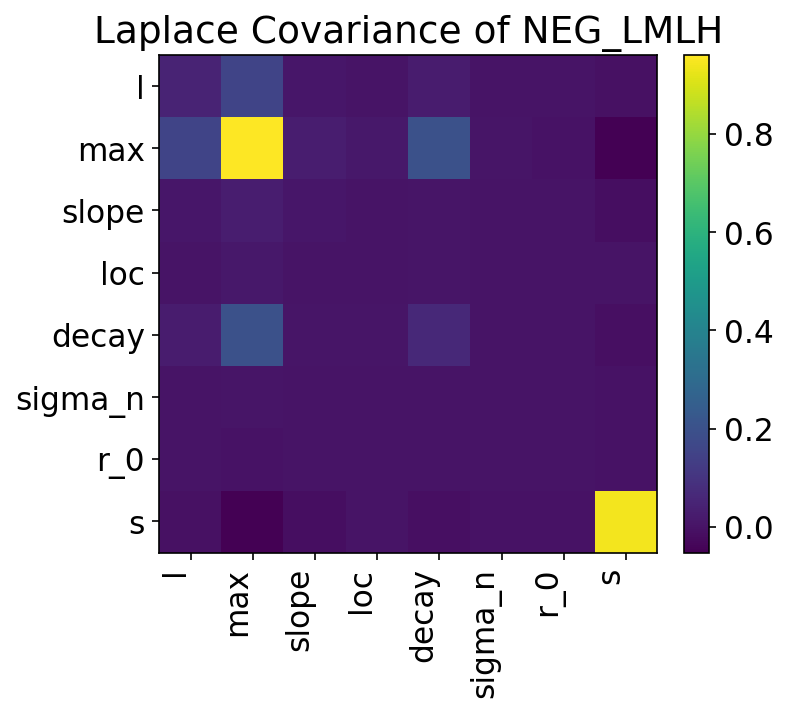

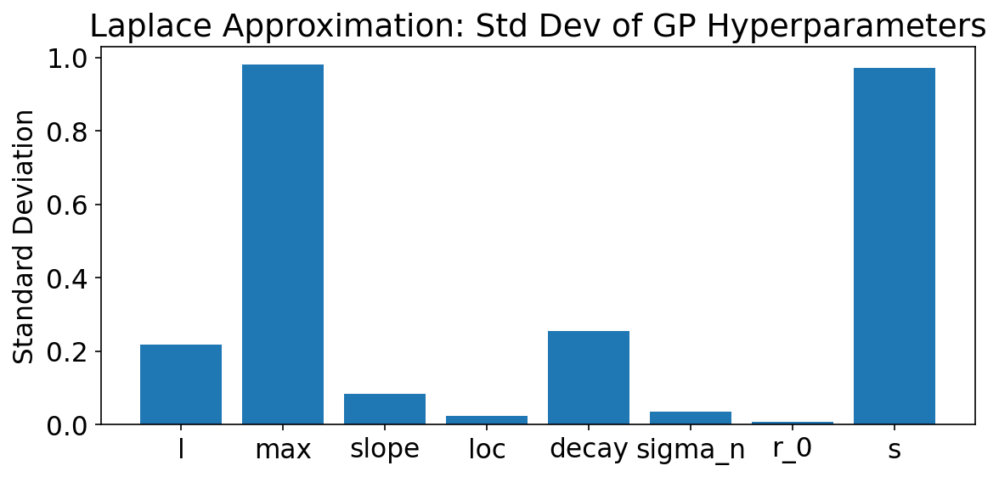

In [5]:
q_train = q_values
sq_train = partial_sq_OO

loss_at_map = gp.NEG_LMLH_Trapz(r_grid, q_values, sq_train)

grad = torch.autograd.grad(loss_at_map, gp.theta_raw, create_graph=True)[0]  # shape: (P,)
P = grad.numel()
grad_flat = grad.view(-1)

H = torch.zeros(P, P, device=grad.device)
for i in range(P):
    grad2 = torch.autograd.grad(grad_flat[i], gp.theta_raw, retain_graph=True)[0].view(-1)
    H[i] = grad2.detach()

L = torch.linalg.cholesky(gp.nearestPD(H))  
cov_laplace = torch.cholesky_inverse(L)

stds = torch.sqrt(torch.diag(cov_laplace)).cpu().numpy()

fig, ax = plt.subplots(figsize=(6, 5), dpi=150)
im = ax.imshow(cov_laplace, cmap='viridis')
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

ax.set_xticks(range(P))
ax.set_yticks(range(P))
ax.set_xticklabels(names, rotation=90, ha='right')
ax.set_yticklabels(names)
ax.set_title("Laplace Covariance of NEG_LMLH")
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(8, 4), dpi=150)
ax.bar(names, stds)
ax.set_ylabel("Standard Deviation")
ax.set_title("Laplace Approximation: Std Dev of GP Hyperparameters")
plt.tight_layout()
plt.show()

#  Compute the Posteriors

In [45]:
with torch.no_grad():

    r_grid =  torch.linspace(0.01, 25  , 1000).reshape(-1,1)
    r_infer = torch.linspace(0.01, 12.5, 1000).reshape(-1,1)
    q_infer = torch.linspace(0.01, 12.5, 1000).reshape(-1,1)

    # Calculate Posterior Mean and Cov in momentum space
    μ_q_post, Σ_q_post = gp.predict_sq_trapz(r_grid, q_infer, q_train, sq_train,adjust=False)
    μ_q_post = μ_q_post.detach()
    Σ_q_post = Σ_q_post.detach()
    
    μ_q_prior = gp.mean_q(r_grid,q_infer)
    Σ_q_prior = gp.K_qq(r_grid, r_grid, q_infer, q_infer,adjust=False)

    # Calculate Posterior Mean and Cov in real space
    μ_r_post, Σ_r_post = gp.predict_rdf_trapz(r_grid, r_infer, q_train, sq_train,adjust=False)
    μ_r_post = μ_r_post.detach()
    Σ_r_post = Σ_r_post.detach()
    
    μ_r_prior = gp.mean_r(r_infer)
    Σ_r_prior = gp.K_rr(r_infer, r_infer,adjust=False)

    kernels = [(Σ_q_post, q_infer.T[0], q_infer.T[0]),(Σ_r_post, r_infer.T[0], r_infer.T[0])]   

    μ_r_post_other, Σ_r_post_other = gp.predict_rdf_trapz(r_grid, r.reshape(-1,1), q_train, sq_train,adjust=False)
    μ_r_post_other = μ_r_post_other.detach()
    Σ_r_post_other = Σ_r_post_other.detach()       

# Plot the Posteriors

In [51]:
titles = ["$\Sigma_{{Post.}}$", "$\Sigma_{{Post.,RDF}}$",]
xlabels = ["$q [\AA^{-1}]$", "$r [\AA]$"]
ylabels = ["$q [\AA^{-1}]$", "$r [\AA]$"]

fig = plt.figure(figsize=(12, 14), dpi=600)
gs = GridSpec(3, 2, figure=fig, height_ratios=[1, 1, 0.8])  # last row is shorter

axs = np.empty((2, 2), dtype=object)
axs[0, 0] = fig.add_subplot(gs[0, 0])
axs[0, 1] = fig.add_subplot(gs[0, 1])
axs[1, 0] = fig.add_subplot(gs[1, 0])
axs[1, 1] = fig.add_subplot(gs[1, 1])
ax_bottom = fig.add_subplot(gs[2, :]) 

bound = 30

for idx, (ax, (kernel, x_dom, y_dom), title, xlabel, ylabel) in enumerate(
        zip(axs[:,0], kernels, titles, xlabels, ylabels)):

    kernel = kernel.clamp(-bound, bound)         
    vmin, vmax = -bound, bound
    extend_opt = 'both'                     

    c = ax.pcolormesh(x_dom.numpy(), y_dom.numpy(),
                      kernel.numpy(), shading='auto',
                      cmap='viridis')
    
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_aspect('equal')

    cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04,
                 extend=extend_opt, extendfrac=0.05)
    
    cb.formatter = ScalarFormatter(useMathText=True)
    cb.formatter.set_scientific(True)
    cb.formatter.set_powerlimits((-2, 2))
    cb.update_ticks()
    
axs[0,0].set_xticks(np.linspace(0, 12, 5) )
axs[0,0].set_yticks(np.linspace(0, 12, 5) )

axs[1,0].set_xticks(np.linspace(0, 12, 5) )
axs[1,0].set_yticks(np.linspace(0, 12, 5) )
    
fill_between_alpha = 0.3
prior_fill_between_ratio = 0.5
lettering_size = 20

axs[0,1].plot(q_infer.T[0], μ_q_prior.T[0], label="Prior Mean", linestyle='dashed', alpha=0.5, color='r')
axs[0,1].fill_between(q_infer.T[0], μ_q_prior.T[0] + 2*torch.diag(Σ_q_prior)**0.5, μ_q_prior.T[0] - 2*torch.diag(Σ_q_prior)**0.5, alpha=prior_fill_between_ratio*fill_between_alpha, label="Prior Mean +/- 2 std.", color='r')
axs[0,1].plot(q_infer.T[0], μ_q_post.T[0], label="Posterior Mean", color='b')
axs[0,1].fill_between(q_infer.T[0], μ_q_post.T[0] + 2*torch.diag(Σ_q_post)**0.5, μ_q_post.T[0] - 2*torch.diag(Σ_q_post)**0.5, alpha=fill_between_alpha, label="Posterior Mean +/- 2 std.", color='b')
# axs[0,1].plot(q_values,partial_sq_OO, label='Skinnner S(q)', alpha=0.8, color='k', linestyle='dashdot')
axs[0,1].scatter(q_train, sq_train, label='Experimental S(q)', alpha=0.1, color='k')
axs[0,1].set_xlim(0, 12.5)
axs[0,1].set_ylim(-1.2,0.5)
axs[0,1].set_xlabel('$q [Å^{-1}]$')
axs[0,1].set_ylabel('$S_{OO}(q)$')

axs[1,1].plot(r_infer.T[0], μ_r_prior.T[0], label="Prior Mean", linestyle='dashed', alpha=0.5, color='r')
axs[1,1].fill_between(r_infer.T[0], μ_r_prior.T[0] + 2*torch.diag(Σ_r_prior)**0.5, μ_r_prior.T[0] - 2*torch.diag(Σ_r_prior)**0.5, alpha=prior_fill_between_ratio*fill_between_alpha, label="Prior Mean +/- 2 std.", color='r')
axs[1,1].plot(r_infer.T[0], μ_r_post.T[0], label="Posterior Mean", color='b')
axs[1,1].fill_between(r_infer.T[0], μ_r_post.T[0] + 2*torch.diag(Σ_r_post)**0.5, μ_r_post.T[0] - 2*torch.diag(Σ_r_post)**0.5, alpha=fill_between_alpha, label="Posterior Mean +/- 2 std.", color='b')
axs[1,1].plot(r,gr_OO, label='Skinnner g(r)', alpha=0.8, color='k', linestyle='dashdot')
axs[1,1].fill_between(r,gr_OO + 2*error_skinner, gr_OO - 2*error_skinner  , label='Skinnner Error g(r)', alpha=fill_between_alpha, linestyle='dashdot',color='green')

# axs[1,1].plot(r_infer.T[0], gptransform.sq2rdf(q_train.T[0], sq_train.T[0], r_infer.T[0], density)+1, label='$\mathcal{H}$ of Experimental S(q)', color='darkgreen',alpha=0.8,linestyle='dashdot')
axs[1,1].set_ylim(-0.1, 3.4)
axs[1,1].set_xlim(0, 25)
axs[1,1].set_xlabel('$r [Å]$')
axs[1,1].set_ylabel('$g(r)$')

     
axins = inset_axes(
    axs[1, 1],
    width="35%", height="35%",
    bbox_to_anchor=(0.62, 0.1, 1, 1),
    bbox_transform=axs[1,1].transAxes,
    loc='lower left',
    borderpad=0
)

axins.plot(r_infer.T[0], μ_r_post.T[0], label="Posterior Mean", color='b')
axins.fill_between(r_infer.T[0], μ_r_post.T[0] + 2*torch.diag(Σ_r_post)**0.5, μ_r_post.T[0] - 2*torch.diag(Σ_r_post)**0.5, alpha=fill_between_alpha, label="Posterior Mean +/- 2 std.", color='b')
axins.plot(r,gr_OO, label='True S(q)/g(r)', alpha=0.8, color='k', linestyle='dashdot')
axins.fill_between(r,gr_OO + 2*error_skinner, gr_OO - 2*error_skinner  , label='Skinnner Error g(r)', alpha=fill_between_alpha, linestyle='dashdot',color='green')
# axins.plot(r_infer.T[0], gptransform.sq2rdf(q_train.T[0], sq_train.T[0], r_infer.T[0], density)+1, label='$\mathcal{H}$ of Experimental S(q)', color='darkgreen',alpha=0.8,linestyle='dashdot')
axins.set_ylim(0.8, 1.2)
axins.set_xlim(3, 5.4)
axins.set_xticks([3.0, 4.0, 5.0])
axins.set_yticks([0.85, 1.0, 1.15])




axins.tick_params(labelsize=12)

mark_inset(axs[1,1], axins, loc1=2, loc2=3, fc="none", ec="0.5",linestyle='dashed',alpha=0.5)


axins = inset_axes(axs[1,1],
                   width="35%", height="35%",      
                   loc='upper right',              
                   borderpad=1.2)                  

axins.plot(r_infer.T[0], μ_r_post.T[0], label="Posterior Mean", color='b')
axins.fill_between(r_infer.T[0], μ_r_post.T[0] + 2*torch.diag(Σ_r_post)**0.5, μ_r_post.T[0] - 2*torch.diag(Σ_r_post)**0.5, alpha=fill_between_alpha, label="Posterior Mean +/- 2 std.", color='b')
axins.plot(r,gr_OO, label='Skinnner g(r)', alpha=0.8, color='k', linestyle='dashdot')
axins.fill_between(r,gr_OO + 2*error_skinner, gr_OO - 2*error_skinner  , label='Skinnner Error g(r)', alpha=fill_between_alpha, linestyle='dashdot',color='green')
# axins.plot(r_infer.T[0], gptransform.sq2rdf(q_train.T[0], sq_train.T[0], r_infer.T[0], density)+1, label='$\mathcal{H}$ of Experimental S(q)', color='darkgreen',alpha=0.8,linestyle='dashdot')
axins.set_ylim(2.1, 2.65)
axins.set_xlim(2.6, 3.0)
axins.set_xticks([2.6, 2.8, 3.0])
axins.set_yticks([2.2, 2.4, 2.6])


axins.tick_params(labelsize=12)
mark_inset(axs[1,1], axins, loc1=2, loc2=3, fc="none", ec="0.5",linestyle='dashed',alpha=0.5)

# ax_bottom.plot(r, μ_r_prior.T[0] - μ_r_post.T[0], label="Prior Mean", linestyle='dashed', alpha=0.5, color='r')
# ax_bottom.fill_between(r, μ_r_prior.T[0]- μ_r_post.T[0] + 2*torch.diag(Σ_r_prior)**0.5, μ_r_prior.T[0]- μ_r_post.T[0] - 2*torch.diag(Σ_r_prior)**0.5, alpha=prior_fill_between_ratio*fill_between_alpha, label="Prior Mean +/- 2 std.", color='r')
# ax_bottom.fill_between(r, μ_r_prior.T[0]- μ_r_post.T[0] + 2*torch.diag(Σ_r_prior)**0.5, μ_r_prior.T[0]- μ_r_post.T[0] - 2*torch.diag(Σ_r_prior)**0.5, alpha=prior_fill_between_ratio*fill_between_alpha, label="Prior Mean +/- 2 std.", color='r')
# ax_bottom.plot(r, gptransform.sq2rdf(q_train.T[0], sq_train.T[0], r, density)+1 - μ_r_post.T[0], label='RFT of Experimental S(q)', color='darkgreen',alpha=0.8,linestyle='dashdot')
ax_bottom.plot(r, μ_r_post_other.T[0]- μ_r_post_other.T[0], label="Posterior Mean", color='b')
ax_bottom.fill_between(r, μ_r_post_other.T[0]- μ_r_post_other.T[0] + 2*torch.diag(Σ_r_post_other)**0.5, μ_r_post_other.T[0]- μ_r_post_other.T[0] - 2*torch.diag(Σ_r_post_other)**0.5, alpha=fill_between_alpha, color='b')
ax_bottom.plot(r,gr_OO - μ_r_post_other.T[0] , label='Skinnner g(r)', alpha=0.8, color='k', linestyle='dashdot')
ax_bottom.fill_between(r,gr_OO + 2*error_skinner - (μ_r_post_other.T[0] ), gr_OO - 2*error_skinner - (μ_r_post_other.T[0])  , label='Skinnner Error g(r)', alpha=fill_between_alpha, linestyle='dashdot',color='green')
ax_bottom.set_ylim(-0.25,0.25)
ax_bottom.set_xlim(0,15)
ax_bottom.set_xlabel('$r [Å]$')
ax_bottom.set_ylabel('$\Delta g(r)$')


# Collect unique legend handles and labels
handles1, labels1 = axs[0,1].get_legend_handles_labels()
handles2, labels2 = axs[1,1].get_legend_handles_labels()
handles3, labels3 = ax_bottom.get_legend_handles_labels()

# Use dict to ensure uniqueness
handle_label_dict = dict(zip(labels1 + labels2 + labels3, handles1 + handles2 + handles3))
labels_combined, handles_combined = zip(*handle_label_dict.items())

# Add figure-level legend below all subplots
fig.legend(
    handles_combined, labels_combined,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.05),
    ncol=4,
    frameon=True
)

for i, ax in enumerate(axs.flat):
    label = f"$({string.ascii_lowercase[i]})$"
    ax.text(-0.05, 1.1, label,
            transform=ax.transAxes,
            fontsize=lettering_size, va='top', ha='left')
    
ax_bottom.text(-0.05, 1.1, "$(e)$",
               transform=ax_bottom.transAxes,
               fontsize=lettering_size, va='top', ha='left')

plt.tight_layout()
plt.savefig("figs/OO_experimental_post.png", bbox_inches='tight')

/var/folders/tv/1d811xv917v4wz50x1bqpvcc0000gn/T/ipykernel_19513/3152647.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


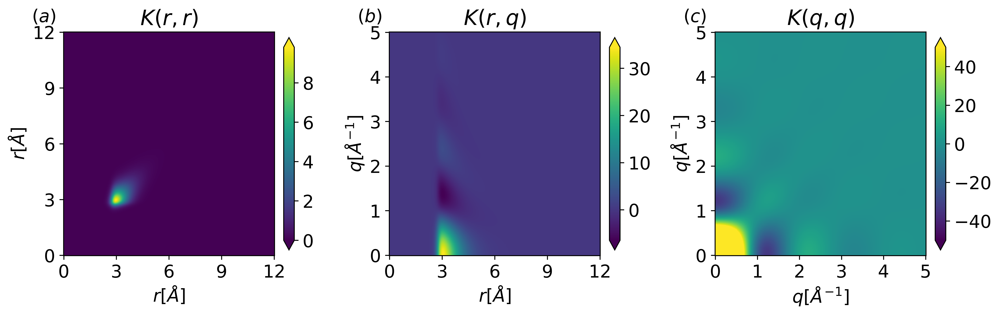

In [8]:

with torch.no_grad():
    r_infer_k_plot = torch.linspace(0.0001, 12, 400, dtype=torch.float64).reshape(-1, 1)
    q_infer_k_plot = torch.linspace(0.0001, 5, 300, dtype=torch.float64).reshape(-1, 1)
    bound = 50

    K1_matrix = gp.K_rr(r_infer_k_plot, r_infer_k_plot, adjust=False).detach()
    K2_matrix = gp.K_rq(r_infer_k_plot, r_grid, q_infer_k_plot, adjust=False).T.detach()
    K3_matrix = gp.K_qq(r_grid, r_grid, q_infer_k_plot, q_infer_k_plot, adjust=False).detach()

    fig, axs = plt.subplots(1, 3, figsize=(12, 4), dpi=600)

    kernels = [
        (K1_matrix, r_infer_k_plot.T[0], r_infer_k_plot.T[0]),
        (K2_matrix, r_infer_k_plot.T[0], q_infer_k_plot.T[0]),
        (K3_matrix, q_infer_k_plot.T[0], q_infer_k_plot.T[0]),
    ]
    titles = ["$K(r,r)$", "$K(r,q)$", "$K(q,q)$"]
    xlabels = ["$r [\AA]$", "$r [\AA]$", "$q [\AA^{-1}]$"]
    ylabels = ["$r [\AA]$", "$q [\AA^{-1}]$", "$q [\AA^{-1}]$"]

    for idx, (ax, (kernel, x_dom, y_dom), title, xlabel, ylabel) in enumerate(
        zip(axs, kernels, titles, xlabels, ylabels)
    ):
        if idx == 0:
            ticks = np.linspace(0, 12, 5) 
            ax.set_xticks(ticks)
            ax.set_yticks(ticks)
        if idx == 1:
            ax.set_xticks(np.linspace(0, 12, 5) )
            ax.set_yticks(np.linspace(0, 5, 6) )
        if idx == 2:
            kernel = kernel.clamp(-bound, bound)
            vmin, vmax = -bound, bound
            ax.set_yticks(np.linspace(0, 5, 6) )
            ax.set_xticks(np.linspace(0, 5, 6) )
        else:
            vmin, vmax = None, None

        pcm = ax.pcolormesh(x_dom.numpy(), y_dom.numpy(), kernel.numpy(),
                            shading='auto', cmap='viridis',
                            vmin=vmin, vmax=vmax)

        ax.set_title(title)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)


        # Colorbar on the right with caps
        cb = fig.colorbar(pcm, ax=ax, orientation='vertical',
                          extend='both', extendfrac=0.05,
                          fraction=0.046, pad=0.04)

    # Add subplot labels
    for i, ax in enumerate(axs):
        label = f"$({string.ascii_lowercase[i]})$"
        ax.text(-0.15, 1.105, label, transform=ax.transAxes,
                va='top', ha='left')

    plt.tight_layout()
    plt.savefig("figs/OO_experimental_kernels.png", bbox_inches='tight')

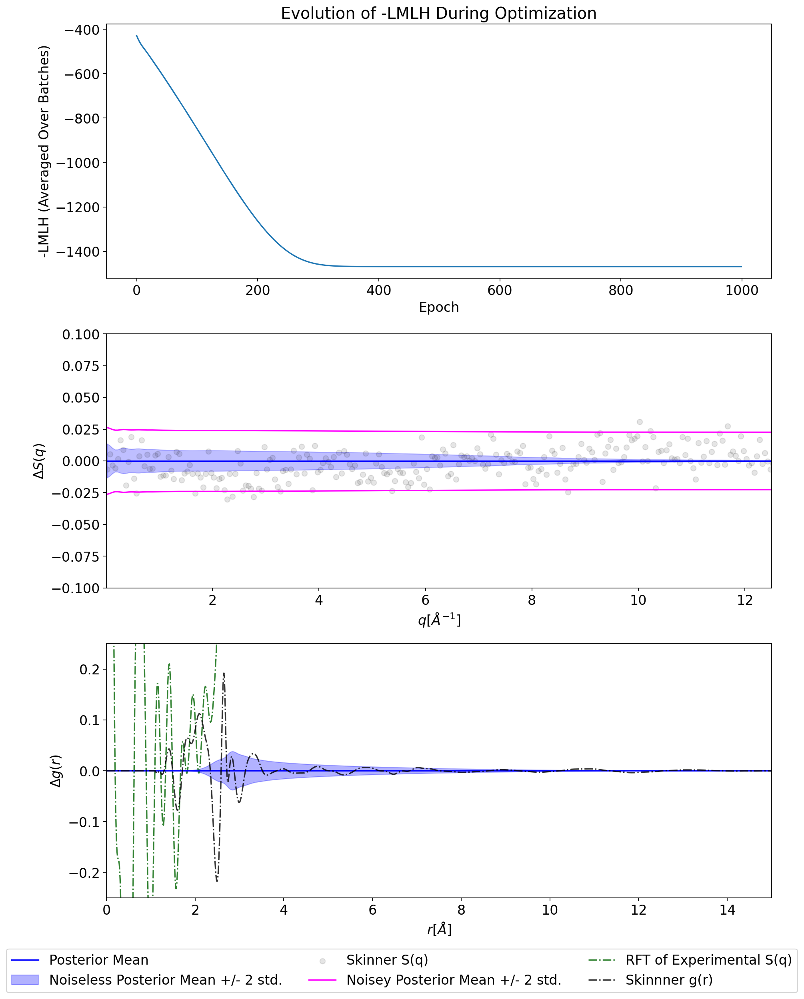

In [9]:
with torch.no_grad():
    fig, axs = plt.subplots(3,1, figsize=(12, 15), dpi=160)
    
    q_infer = q_train
        
    # Calculate Prior Mean and Cov
    Σ_q_prior = gp.K_qq(r_grid,r_grid,q_infer,q_infer).detach()
    μ_q_prior = gp.mean_q(r_grid,q_infer).detach()
    
    Σ_r_prior = gp.K_rr(r.reshape(-1,1),r.reshape(-1,1)).detach()
    μ_r_prior = gp.mean_r(r.reshape(-1,1)).detach()

    # Calculate Posterior Mean and Cov
    μ_q_post, Σ_q_post = gp.predict_sq_trapz(r_grid, q_infer, q_train, sq_train,adjust=False)
    μ_q_post = μ_q_post.detach()
    Σ_q_post = Σ_q_post.detach()
    
    μ_r_post, Σ_r_post = gp.predict_rdf_trapz(r_grid, r.reshape(-1,1), q_train, sq_train,adjust=False)
    μ_r_post = μ_r_post.detach()
    Σ_r_post = Σ_r_post.detach()    
        
    axs[1].plot(q_infer.T[0],torch.zeros_like(q_infer.T[0]),label="Posterior Mean",color='b')
    axs[1].fill_between(q_infer.T[0],2*torch.diag(Σ_q_post)**0.5,  -2*torch.diag(Σ_q_post)**0.5,alpha=0.25,label="Noiseless Posterior Mean +/- 2 std.",color='b')
    axs[1].scatter(q_train,sq_train-μ_q_post,label='Skinner S(q)',alpha=0.1,color='k')
    axs[1].plot(q_infer.T[0],2*torch.diag(Σ_q_post + torch.eye(len(q_infer))*(gp.theta[5]**2))**0.5,label="Noisey Posterior Mean +/- 2 std.",color='magenta')
    axs[1].plot(q_infer.T[0],-2*torch.diag(Σ_q_post + torch.eye(len(q_infer))*(gp.theta[5]**2))**0.5,color='magenta')

    axs[1].set_xlim(0.01,12.5)
    axs[1].set_ylim(-0.1,0.1)

    axs[1].set_xlabel('$q [Å^{-1}]$')
    axs[1].set_ylabel('$\Delta S(q)$')
    
    # axs[2].plot(r, μ_r_prior.T[0] - μ_r_post.T[0], label="Prior Mean", linestyle='dashed', alpha=0.5, color='r')
    # axs[2].fill_between(r, μ_r_prior.T[0]- μ_r_post.T[0] + 2*torch.diag(Σ_r_prior)**0.5, μ_r_prior.T[0]- μ_r_post.T[0] - 2*torch.diag(Σ_r_prior)**0.5, alpha=prior_fill_between_ratio*fill_between_alpha, label="Prior Mean +/- 2 std.", color='r')
    axs[2].plot(r, gptransform.sq2rdf(q_train.T[0], sq_train.T[0], r, density)+1 - μ_r_post[0], label='RFT of Experimental S(q)', color='darkgreen',alpha=0.8,linestyle='dashdot')
    axs[2].plot(r, μ_r_post.T[0]- μ_r_post.T[0], label="Posterior Mean", color='b')
    axs[2].fill_between(r, μ_r_post.T[0]- μ_r_post.T[0] + 2*torch.diag(Σ_r_post)**0.5, μ_r_post.T[0]- μ_r_post.T[0] - 2*torch.diag(Σ_r_post)**0.5, alpha=fill_between_alpha, label="Noiseless Posterior Mean +/- 2 std.", color='b')
    axs[2].plot(r,gr_OO - μ_r_post.T[0] , label='Skinnner g(r)', alpha=0.8, color='k', linestyle='dashdot')
    
    axs[2].set_ylim(-0.25,0.25)
    axs[2].set_xlim(0,15)
    axs[2].set_xlabel('$r [Å]$')
    axs[2].set_ylabel('$\Delta g(r)$')


    axs[0].plot(torch.tensor(losses), linestyle='-')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('-LMLH (Averaged Over Batches)')
    axs[0].set_title('Evolution of -LMLH During Optimization')
    
    # Collect unique legend handles and labels
    handles1, labels1 = axs[1].get_legend_handles_labels()
    handles2, labels2 = axs[2].get_legend_handles_labels()

    # Use dict to ensure uniqueness
    handle_label_dict = dict(zip(labels1 + labels2, handles1 + handles2))
    labels_combined, handles_combined = zip(*handle_label_dict.items())

    # Add figure-level legend below all subplots
    fig.legend(
        handles_combined, labels_combined,
        loc='lower center',
        bbox_to_anchor=(0.5, -0.05),
        ncol=3,
        frameon=True
    )

plt.tight_layout()
plt.savefig("figs/OO_experimental_si.png", bbox_inches='tight')

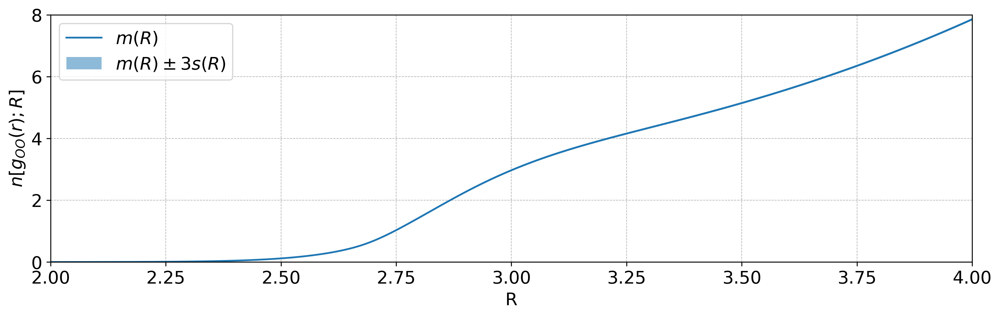

In [10]:
plt.figure(figsize=(12, 4),dpi=300)
with torch.no_grad():
    r_infer = torch.linspace(2, 6, 2000).reshape(-1,1)
    # Calculate Posterior Mean and Cov
    μ_r_post, Σ_r_post = gp.predict_rdf_trapz(r_grid, r_infer, q_train, sq_train,adjust=False)
    μ_r_post = μ_r_post.detach()
    Σ_r_post = Σ_r_post.detach()

    dr = (r_infer[1] - r_infer[0]).item() # Stepsize
    n_μ  = torch.zeros(len(r_infer))
    for j in range (len(r_infer)):
        n_μ[j] = 4*np.pi*density*torch.trapz(((r_infer[:j]**2)*μ_r_post[:j]).reshape(-1),dx = dr)

    n_σ = torch.zeros(len(r_infer))
    rr_prime = torch.outer(r_infer.T[0],r_infer.T[0])   
    for j in range (len(r_infer)):
        n_σ[j] = ((4*np.pi*density)**2*torch.trapz(torch.trapz(Σ_r_post[:j,:j]*rr_prime[:j:,:j]**2,dx = dr),dx=dr))**0.5

plt.plot(r_infer, n_μ, linestyle='-',label="$m(R)$")
plt.fill_between(r_infer.T[0], n_μ+3*n_σ, n_μ-3*n_σ,alpha=0.5,label="$m(R) \pm 3s(R)$")
plt.xlabel('R', )
plt.ylabel('$n[g_{OO}(r);R]$', ) 
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.legend()
plt.xlim(2,4)
plt.ylim(0,8)
plt.show()

In [11]:
dist = torch.distributions.MultivariateNormal(μ_r_post.reshape(-1), covariance_matrix=gp.nearestPD(Σ_r_post))
samples = dist.sample((50_000,))  

N, d = samples.shape
threshold = 0.1  # local maxima must be above this threshold

# Compute local maxima mask
left = samples[:, :-2]
mid = samples[:, 1:-1]
right = samples[:, 2:]
is_local_max = (mid > left) & (mid > right) & (mid > threshold)

# Pad to match shape (N, d)
local_maxima_mask = torch.cat([
    torch.zeros((N, 1), dtype=torch.bool),
    is_local_max,
    torch.zeros((N, 1), dtype=torch.bool)
], dim=1)

# Store first 3 maxima indices and valley *indices* between them
maxima_indices = torch.full((N, 3), -1, dtype=torch.long)
valley_indices = torch.full((N, 2), -1, dtype=torch.long)

for i in range(N):
    idxs = torch.where(local_maxima_mask[i])[0]
    num = min(3, len(idxs))
    if num > 0:
        maxima_indices[i, :num] = idxs[:num]
        if num >= 2:
            a, b = idxs[0].item(), idxs[1].item()
            if b > a + 1:
                segment = samples[i, a+1:b]
                min_idx = torch.argmin(segment).item() + a + 1
                valley_indices[i, 0] = min_idx
        if num == 3:
            b, c = idxs[1].item(), idxs[2].item()
            if c > b + 1:
                segment = samples[i, b+1:c]
                min_idx = torch.argmin(segment).item() + b + 1
                valley_indices[i, 1] = min_idx

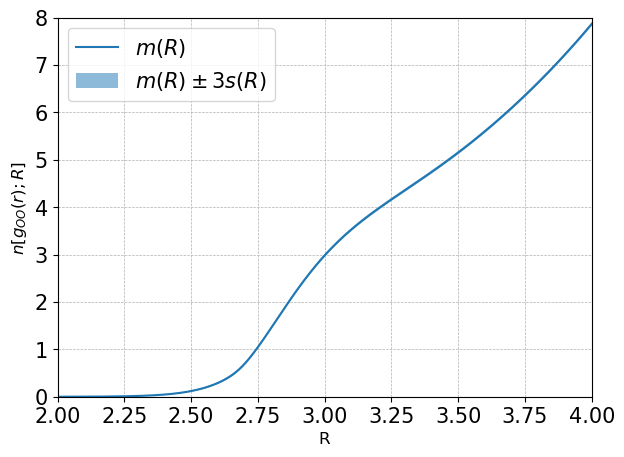

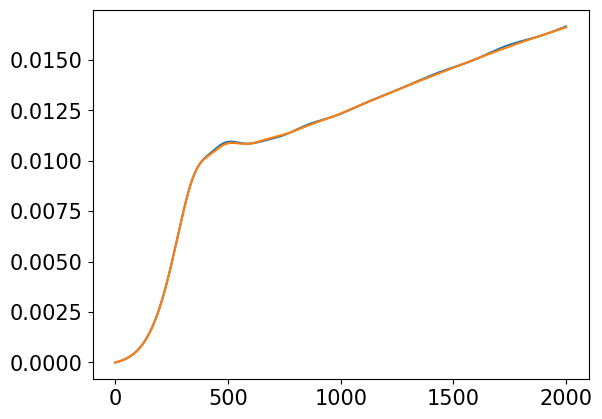

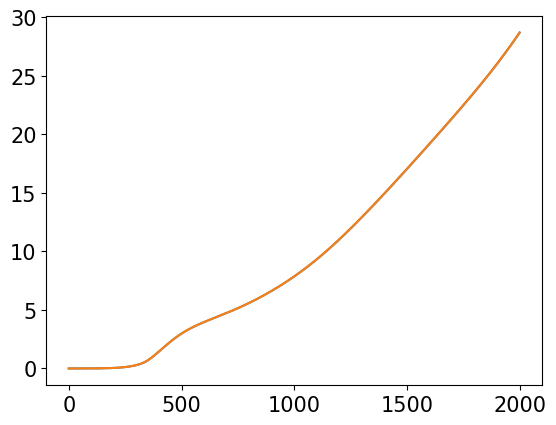

In [12]:
# Quick test of a monte carlo scheme to see if the numerical integral I did before was right
# Sanity check really.
integrand = samples * (4 * np.pi * density * r_infer.T.expand(50_000, -1)**2)

# Compute cumulative integrals using trapezoid rule
trap_mid = 0.5 * (integrand[:, 1:] + integrand[:, :-1])  # shape: (N, D-1)
n_func_samples = torch.zeros_like(samples)  # shape: (N, D)
n_func_samples[:, 1:] = torch.cumsum(trap_mid * dr, dim=1)

mc_mean = n_func_samples.mean(dim=0)
mc_std = n_func_samples.std(dim=0,unbiased=True)

plt.plot(r_infer, mc_mean, linestyle='-',label="$m(R)$")
plt.fill_between(r_infer.T[0], mc_mean+3*mc_std, mc_mean-3*mc_std,alpha=0.5,label="$m(R) \pm 3s(R)$")
plt.xlabel('R', fontsize=12)
plt.ylabel('$n[g_{OO}(r);R]$', fontsize=12)
# plt.title('Plot of $n[g(r);R]$ vs r', fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.legend()
plt.xlim(2,4)
plt.ylim(0,8)
plt.show()

plt.plot(mc_std)
plt.plot(n_σ)
plt.show()

plt.plot(mc_mean)
plt.plot(n_μ)
plt.show()

In [13]:
# Calculate Posterior Mean and Cov
dr = (r_infer[1] - r_infer[0]).item() # Stepsize
n_samples  = torch.zeros(50_000)
r_1_samples = torch.zeros(50_000)
peak_locs = torch.zeros(50_000,2)
peak_heights = torch.zeros(50_000,2)
for j in range (len(n_samples)):
    dr = (r_infer[1] - r_infer[0]).item() # Stepsize
    r_1 = valley_indices[j,0]
    r_1_samples[j] = r_infer[r_1]
    n_samples[j] = 4*np.pi*density*torch.trapz(((r_infer[:r_1].reshape(-1)**2)*samples[j][:r_1]),dx = dr)
    peak_locs[j,1] = r_infer[maxima_indices[j,1]]
    peak_heights[j,1] = samples[j,maxima_indices[j,1]]

In [14]:
r_infer_peak_height = torch.linspace(2.77, 2.85, 2000).reshape(-1,1)
μ_r_post, Σ_r_post = gp.predict_rdf_trapz(r_grid, r_infer_peak_height, q_train, sq_train,adjust=False)
μ_r_post = μ_r_post.detach()
Σ_r_post = Σ_r_post.detach()

dist = torch.distributions.MultivariateNormal(μ_r_post.reshape(-1), covariance_matrix=gp.nearestPD(Σ_r_post))
samples = dist.sample((50_000,))  

N, d = samples.shape
threshold = 0.1  # local maxima must be above this threshold

# Compute local maxima mask
left = samples[:, :-2]
mid = samples[:, 1:-1]
right = samples[:, 2:]
is_local_max = (mid > left) & (mid > right) & (mid > threshold)

# Pad to match shape (n_samples, d)
local_maxima_mask = torch.cat([
    torch.zeros((N, 1), dtype=torch.bool),
    is_local_max,
    torch.zeros((N, 1), dtype=torch.bool)
], dim=1)

# Store first 3 maxima indices and valley indices between them
maxima_indices = torch.full((N, 3), -1, dtype=torch.long)
valley_indices = torch.full((N, 2), -1, dtype=torch.long)

for i in range(N):
    idxs = torch.where(local_maxima_mask[i])[0]
    num = min(3, len(idxs))
    if num > 0:
        maxima_indices[i, :num] = idxs[:num]
        if num >= 2:
            a, b = idxs[0].item(), idxs[1].item()
            if b > a + 1:
                segment = samples[i, a+1:b]
                min_idx = torch.argmin(segment).item() + a + 1
                valley_indices[i, 0] = min_idx
        if num == 3:
            b, c = idxs[1].item(), idxs[2].item()
            if c > b + 1:
                segment = samples[i, b+1:c]
                min_idx = torch.argmin(segment).item() + b + 1
                valley_indices[i, 1] = min_idx
                

for j in range (50_000):
    peak_locs[j,0] = r_infer_peak_height[maxima_indices[j,0]]
    peak_heights[j,0] = samples[j,maxima_indices[j,0]]

/var/folders/tv/1d811xv917v4wz50x1bqpvcc0000gn/T/ipykernel_19513/3555070366.py:101: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.85])  # Leave room for stats table and colorbar


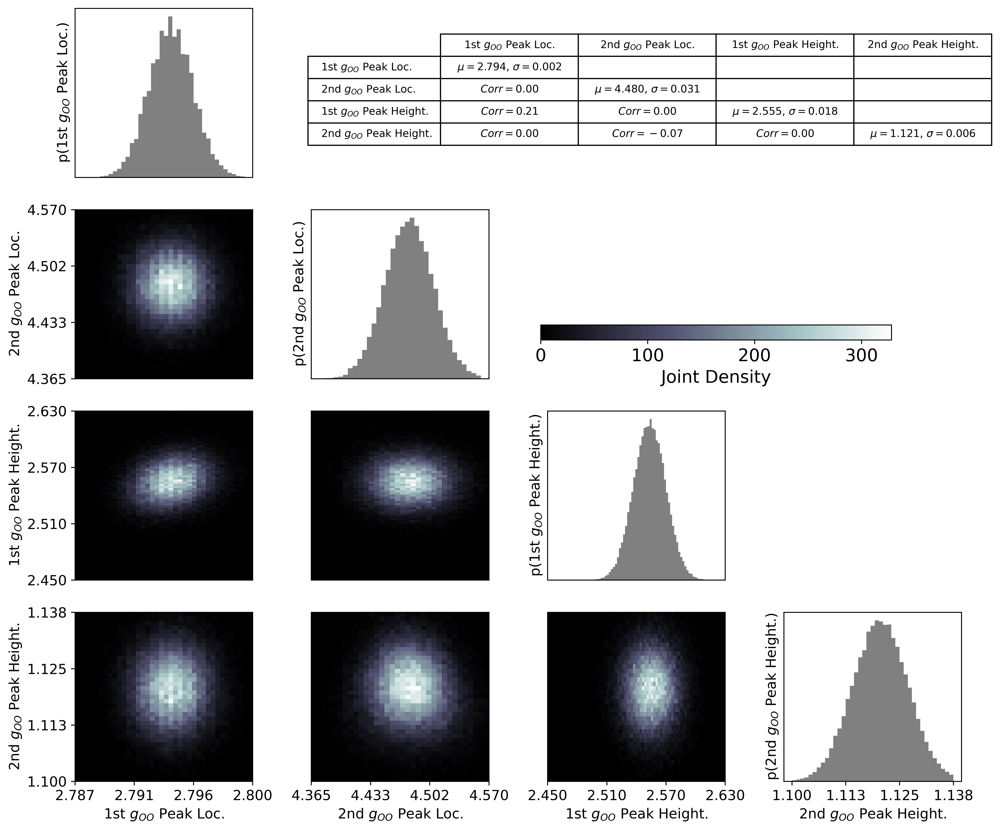

In [32]:
# Combine data
data = torch.cat([peak_locs, peak_heights], dim=1).numpy()
labels = [
    "1st $g_{OO}$ Peak Loc.",
    "2nd $g_{OO}$ Peak Loc.",
    "1st $g_{OO}$ Peak Height.",
    "2nd $g_{OO}$ Peak Height."
]
n_dims = data.shape[1]

# Define bin edges for each parameter
bin_edges = [
    np.linspace(2.787, 2.8, 39),
    np.linspace(4.365, 4.57, 35),
    np.linspace(2.45, 2.63, 80),
    np.linspace(1.1, 1.138, 40),
]

# Compute summary statistics
means = np.mean(data, axis=0)
stds = np.std(data, axis=0)
corr_matrix = np.corrcoef(data.T)

# Create subplot grid
fig, axes = plt.subplots(n_dims, n_dims, figsize=(12, 12),dpi = 600)
plt.subplots_adjust(hspace=0.05, wspace=0.05)
               

quadmesh = None

for i in range(n_dims):
    for j in range(n_dims):
        ax = axes[i, j]
        if j == 0:
            ax.set_ylabel(labels[i],fontsize=12)
        if i == j:
            ax.hist(data[:, i], bins=bin_edges[i], color='gray', density=True)
            ax.set_ylabel(f"p({labels[i]})",fontsize=12)
        elif i > j:
            h = ax.hist2d(
                data[:, j], data[:, i],
                bins=[bin_edges[j], bin_edges[i]],
                cmap='bone',
            )
            if quadmesh is None:
                quadmesh = h[3]
        else:
            ax.axis("off")

        # Tick labels
        if i == n_dims - 1:
            ax.set_xlabel(labels[j], fontsize=12)
            ticks = np.linspace(bin_edges[j][0], bin_edges[j][-1], 4)
            ax.set_xticks(ticks)
            ax.set_xticklabels([f"{tick:.3f}" for tick in ticks], fontsize=12)
        else:
            ax.set_xticks([])

        if j == 0 and i != j:
            ticks = np.linspace(bin_edges[i][0], bin_edges[i][-1], 4)
            ax.set_yticks(ticks)
            ax.set_yticklabels([f"{tick:.3f}" for tick in ticks], fontsize=12)
        else:
            ax.set_yticks([])

# --- Add summary statistics table in whitespace ---
# Format content for the table
cell_text = []
for i in range(n_dims):
    row = []
    for j in range(n_dims):
        if i == j:
            row.append(f"$\\mu={means[i]:.3f}$, $\\sigma={stds[i]:.3f}$")
        elif i > j:
            row.append(f"$Corr={corr_matrix[i, j]:.2f}$")
        else:
            row.append("")
    cell_text.append(row)

# Table axes (place above diagonal region)
table_ax = fig.add_axes([0.45, 0.7, 0.55, 0.1])  # [left, bottom, width, height]
table_ax.axis('off')
the_table = table_ax.table(
    cellText=cell_text,
    rowLabels=labels,
    colLabels=labels,
    loc='center',
    cellLoc='center'
)
the_table.scale(1, 1.6)
the_table.auto_set_font_size(False)
the_table.set_fontsize(9)

# Add colorbar
cbar_ax = fig.add_axes([0.55, 0.5, 0.35, 0.015])
cbar = fig.colorbar(quadmesh, cax=cbar_ax, orientation='horizontal')
cbar.set_label("Joint Density")



plt.tight_layout(rect=[0, 0, 1, 0.85])  # Leave room for stats table and colorbar
plt.savefig('figs/peaks.png')

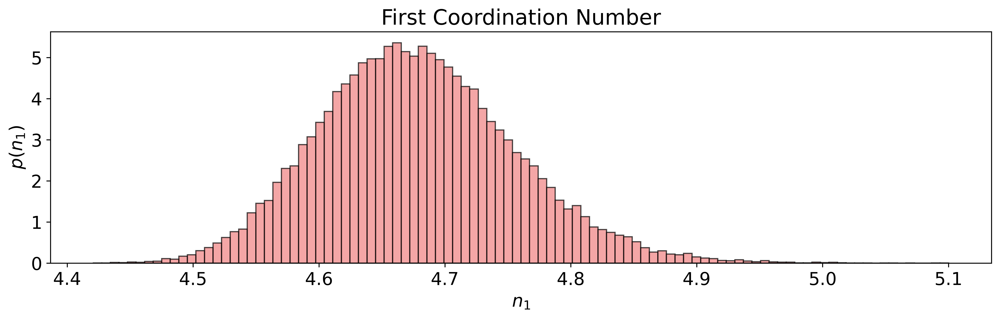

In [42]:

fig, axs = plt.subplots(1, 1, figsize=(12, 4),dpi=600)

axs.hist(n_samples, bins=100, density=True, color='lightcoral', edgecolor='black', alpha=0.7)
axs.set_xlabel(r'$n_1$')
axs.set_ylabel('$p(n_1)$')
axs.set_title('First Coordination Number')
plt.tight_layout()
plt.savefig("figs/coordnumberhist.png")

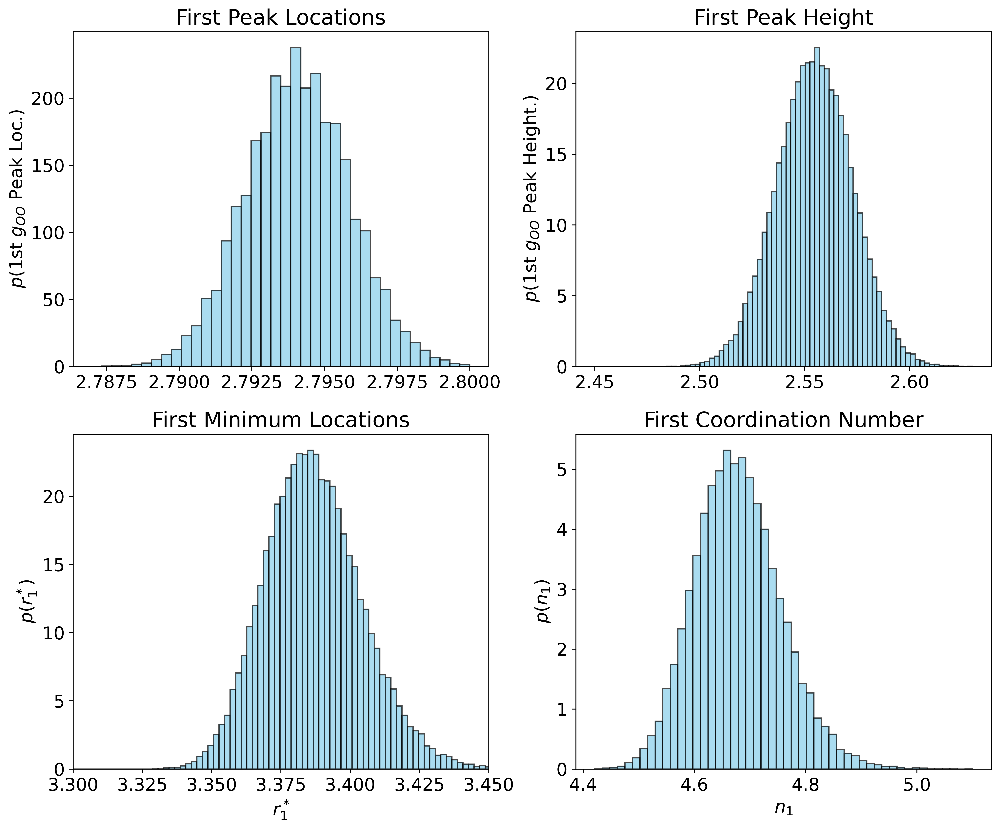

In [40]:
fig, axs = plt.subplots(2, 2, figsize=(12, 10),dpi=600)

bin_edges = [
    np.linspace(2.787, 2.8, 39),
    np.linspace(4.365, 4.57, 35),
    np.linspace(2.45, 2.63, 80),
    np.linspace(1.1, 1.138, 40),
]

axs[0,0].hist(peak_locs[:,0], bins=bin_edges[0], density=True, color='skyblue', edgecolor='black', alpha=0.7)
axs[0,0].set_ylabel(f'{labels[0]}')
axs[0,0].set_ylabel(f'$p(${labels[0]}$)$')
axs[0,0].set_title('First Peak Locations')

axs[0,1].hist(peak_heights[:,0], bins=bin_edges[2], density=True, color='skyblue', edgecolor='black', alpha=0.7)
axs[0,1].set_ylabel(f'{labels[2]}')
axs[0,1].set_ylabel(f'$p(${labels[2]}$)$')
axs[0,1].set_title('First Peak Height')

axs[1,0].hist(r_1_samples, bins=r_infer.T[0][500:750], density=True, color='skyblue', edgecolor='black', alpha=0.7)
axs[1,0].set_xlabel(r'$r_1^*$' )
axs[1,0].set_ylabel('$p(r_1^*)$')
axs[1,0].set_title('First Minimum Locations')
axs[1,0].set_xlim(3.30,3.45)


axs[1,1].hist(n_samples, bins=50, density=True, color='skyblue', edgecolor='black', alpha=0.7)
axs[1,1].set_xlabel(r'$n_1$')
axs[1,1].set_ylabel('$p(n_1)$')
axs[1,1].set_title('First Coordination Number')

plt.tight_layout()
plt.savefig("figs/Somehist.png")